In [1]:
'''
Date: 24/Jan/2022
Auther: Yike Xie
Content: Figure 4 in dengue paper
'''

'\nDate: 24/Jan/2022\nAuther: Yike Xie\nContent: Figure 4 in dengue paper\n'

In [2]:
import os

import numpy as np
import pandas as pd

import anndata
import scanpy as sc

import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
from matplotlib import gridspec
import matplotlib as mpl
import seaborn as sns

from collections import defaultdict
import random
import itertools
from numpy import *    

In [3]:
import sys
sys.path.append('/home/yike/phd/dengue/dengue_children/paper_figures/final/modules') 
import YK_util, optimized_pair_comparison, functions_CCC_figure_fra_pair
from YK_util import *
from optimized_pair_comparison import *
from functions_CCC_figure_fra_pair import *

In [6]:
# load data
path = '/home/yike/phd/dengue/data/mergedata_luca_NKT_202206.h5ad'
adata = sc.read_h5ad(path)
adata_kid = subsetdata(adata)
adata_kid = normalizedata(adata_kid, log1p=True) # log1p = 2
adata_kid = removegenes(adata_kid)
adata_kid = adata_kid[(adata_kid.obs.cell_subtype_new != 'doublets') & 
                        (adata_kid.obs.cell_subtype_new != 'unknown')].copy()

sc.pp.filter_genes(adata_kid, min_cells=3)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [7]:
#rename and reorder some celltypes 
adata_kid = adata_kid.copy()
reorg_data(adata_kid) # 'cell_type_new', 'cell_subtype_new'

/home/yike/phd/dengue/dengue_children/paper_figures/final/modules/YK_util.py:172: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['cell_type_new'].cat.reorder_categories(group_order_primary, inplace=True)
/home/yike/phd/dengue/dengue_children/paper_figures/final/modules/YK_util.py:204: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['cell_subtype_new'].cat.reorder_categories(group_order_secondary, inplace=True)


In [8]:
#save path
save_figures = '/home/yike/phd/dengue/docs/paper_draft/figures/figure_4/'
save_tables = '/home/yike/phd/dengue/docs/paper_draft/tabels/'

In [9]:
# get cell types and cell subtypes
cell_types = adata_kid.obs['cell_type_new'].unique().tolist()
cell_subtypes = adata_kid.obs['cell_subtype_new'].unique().tolist()

In [10]:
# load cell type palette
ct_palette = load_ct_palette()
print([ct for ct in ct_palette.keys()])
sns.color_palette(ct_palette.values())

['B cells', 'Plasmablasts', 'T cells', 'NK cells', 'Monocytes', 'conventional DCs', 'plasmacytoid DCs', 'megakaryocytes']


[(0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [11]:
# load cell subtype palette
cst_palette = load_cst_palette()
print([cst for cst in cst_palette.keys()])
sns.color_palette(cst_palette.values())

['memory B cells', 'naive B cells', 'activated B cells', 'proliferating plasmablasts', 'non-proliferating plasmablasts', 'CD4+ naive T cells', 'CD4+ memory T cells', 'CD8+ naive T cells', 'CD8+ effector memory T cells', 'CD8+ exhausted T cells', 'Tregs', 'MAIT', 'signaling NK cells', 'cytotoxic NK cells', 'proliferating NK cells', 'classical monocytes', 'non-classical monocytes', 'intermediate monocytes', 'cDC1', 'cDC2', 'pDCs', 'megakaryocytes']


[(1.0, 0.0, 0.0),
 (0.7372549019607844, 0.5607843137254902, 0.5607843137254902),
 (0.5019607843137255, 0.0, 0.0),
 (1.0, 0.8941176470588236, 0.7686274509803922),
 (1.0, 0.5490196078431373, 0.0),
 (0.6901960784313725, 0.7686274509803922, 0.8705882352941177),
 (0.4392156862745098, 0.5019607843137255, 0.5647058823529412),
 (0.0, 0.0, 0.5019607843137255),
 (0.2549019607843137, 0.4117647058823529, 0.8823529411764706),
 (0.0, 0.7490196078431373, 1.0),
 (0.0, 1.0, 1.0),
 (0.37254901960784315, 0.6196078431372549, 0.6274509803921569),
 (0.5019607843137255, 0.0, 0.5019607843137255),
 (0.8666666666666667, 0.6274509803921569, 0.8666666666666667),
 (1.0, 0.0, 1.0),
 (0.5607843137254902, 0.7372549019607844, 0.5607843137254902),
 (0.5647058823529412, 0.9333333333333333, 0.5647058823529412),
 (0.0, 0.5019607843137255, 0.0),
 (1.0, 0.7529411764705882, 0.796078431372549),
 (1.0, 0.0784313725490196, 0.5764705882352941),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [12]:
def heatmap_cst(cst_pair, g_list, cst_order, vs_type='SD vs D', save_fd=False):
    #rcParams['figure.figsize']=(7, 14)
    rcParams['font.size']=18
    rcParams['pdf.fonttype'] = 42
    rcParams['font.sans-serif'] = "Arial"
    rcParams['figure.dpi'] = 300
    
    
    df = cst_pair.reset_index().set_index('gene').loc[g_list][['cell_subtype', 'med_pair']]

    df_new = pd.DataFrame(np.zeros([len(df.index.unique()), len(cst_order)]), columns=cst_order, index=g_list)

    for idx in df_new.index:    
        for col in df_new.columns:
            df_new.at[idx, col] = df.loc[idx][df.loc[idx]['cell_subtype'] == col]['med_pair'][0]
            
    df_new = pd.DataFrame(np.clip(df_new.values, -3.5, 3.5), columns=df_new.columns, index=df_new.index)
    
    fig, ax = plt.subplots(figsize=[1 + 1.5 * len(cst_order), 0.5 * len(g_list)])
    cmap = sns.diverging_palette(245, 5, as_cmap=True)
    
    ax = sns.heatmap(df_new, cmap=cmap, center=0, yticklabels=True, vmin=-3.5, vmax=3.5,
                     cbar_kws={'label': 'log2 fold change\n[%s]'%vs_type, 'shrink': .3})
    ax.set_ylabel(None)
    
    xlabels = [label.get_text().replace('_', ' ') for label in ax.get_xticklabels()]
    ax.set_xticklabels(xlabels)

    if save_fd is not False:
        fig.savefig(save_figures + save_fd, bbox_inches='tight')

    return {'figure': fig, 'ax': ax}


def pairwise_boxplot(FCs_data, cell_subtype, genes, path=False):
    
    rcParams['font.size']=18
    rcParams['pdf.fonttype'] = 42
    rcParams['font.sans-serif'] = "Arial"
    rcParams['figure.dpi'] = 300
    
    box_data = FCs_data.loc[cell_subtype][genes]
    
    cmap = mpl.cm.get_cmap('coolwarm')
    norm = mpl.colors.Normalize(vmin=-2.5, vmax=2.5)
    palette = [cmap(norm(x)) for x in np.clip(box_data.median(axis=0), -2.5, 2.5)]
    
    box_data = pd.melt(box_data)
    
    fig, ax = plt.subplots(figsize=(6, len(genes)*0.35 + 1))
    sns.boxplot(data = box_data, y = 'variable', x = 'value', palette = palette, width=0.8,
                orient = 'h', linewidth=1, ax=ax)
    
    ax.set(ylabel = None, xlim = (-11, 11))
    ax.set_yticklabels(genes)
    
    ax.set_xlabel('log2 fold change')
    
    ax_cb = fig.add_axes([0.25, 0, 0.5, 0.02])
    cbar = mpl.colorbar.ColorbarBase(ax_cb, norm=norm, cmap=cmap, orientation='horizontal')
    cbar.set_ticks([-2, -1, 0, 1, 2])
    cbar.set_ticklabels(['-2', '-1', '0', '1', '2'])
    cbar.ax.tick_params(labelsize=15)
    cbar.set_label('log2 fold change', fontsize=15)

    for x in [-1, 0, 1]:
        ax.axvline(x, c='black', ls='-.', lw=0.5, zorder=0.5)
    
    if path is not False:
        fig.savefig(save_figures + path, bbox_inches='tight')
        
    return {'figure': fig, 'ax': ax}

def annanote_adult(adata_adult): 
    adata_adult.obs['cell_type_new'] = adata_adult.obs['cell_type']
    adata_adult.obs['cell_type_new'] = adata_adult.obs['cell_type_new'].astype('object')
    adata_adult.obs['cell_subtype_new'] = adata_adult.obs['cell_subtype_new'].astype('object')
    
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'NK_cells', 'cell_type_new'] = 'NK cells'
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'B_cells', 'cell_type_new'] = 'B cells'
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'T_cells', 'cell_type_new'] = 'T cells'
    ####################################
    
    for gene in ['GZMA',  'NKG7', 'GNLY', 'XCL1', 'XCL2', 'FCGR3A', 'CCND2', 'MKI67']:
            adata_adult.obs[gene] = (adata_adult[:, gene].X.toarray() > 0)
    
    ####################  
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'NK cells', 'cell_type_new'] = 'NK_unknown'
    idx_NK = ((adata_adult.obs['cell_type_new'] == 'NK_unknown') &
             (adata_adult.obs['GZMA'] == True) &
             (adata_adult.obs['NKG7'] == True) &
             (adata_adult.obs['GNLY'] == True) )
    adata_adult.obs.loc[idx_NK, 'cell_type_new'] = 'NK cells'
    
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'NK cells', 'cell_subtype_new'] = 'cytotoxic NK cells'
    idx_sig_NK = ((adata_adult.obs['cell_type_new'] == 'NK cells') & 
                        (adata_adult.obs['XCL1'] == True) & 
                        (adata_adult.obs['XCL2'] == True) &
                        (adata_adult.obs['FCGR3A'] == True))
    adata_adult.obs.loc[idx_sig_NK, 'cell_subtype_new'] = 'signaling NK cells'
    
    ####################
    adata_adult.obs.loc[adata_adult.obs['cell_type_new'] == 'Plasmablasts', 'cell_subtype_new'] = 'non-proliferating plasmablasts'
    idx_P = ((adata_adult.obs['cell_type_new'] == 'Plasmablasts') & 
                        (adata_adult.obs['CCND2'] == True) & 
                        (adata_adult.obs['MKI67'] == True))
    adata_adult.obs.loc[idx_P, 
                        'cell_subtype_new'] = 'proliferating plasmablasts'
    
    ####################
    adata_adult.obs['cell_type_new'] = adata_adult.obs['cell_type_new'].astype('category')
    adata_adult.obs['cell_subtype_new'] = adata_adult.obs['cell_subtype_new'].astype('category')    
    return adata_adult

def pairwise_processing(df_kid, df_adult):
    ###### merge two df
    intersect = [x for x in df_kid.index if x in df_adult.index]
    df_adult.columns = [col+'_a' for col in df_adult.columns]
    df_kid = df_kid[['med_pair', 'fra_pair', 'neg_fra_pair']]
    df_adult = df_adult[['med_pair_a', 'fra_pair_a', 'neg_fra_pair_a']]
    df = pd.concat([df_kid.loc[intersect], df_adult.loc[intersect]], axis=1)
    
    ###### define robost genes for kids, adults or both
    ind_kid = df[(df['fra_pair'] >= 39/56) | (df['neg_fra_pair'] >= 39/56)].index
    ind_adult = df[(df['fra_pair_a'] >= 39/56) | (df['neg_fra_pair_a'] >= 39/56)].index
    ind_merge = list(set(ind_kid) & set(ind_adult))
    
    df['outlier'] = 'no'
    df.loc[ind_kid, 'outlier'] = 'x_only'
    df.loc[ind_adult, 'outlier'] = 'y_only'
    df.loc[ind_merge, 'outlier'] = 'both'
    
    ###### calculate marker and distance
    df['x'] = df['med_pair'] - df['med_pair'].mean()
    df['y'] = df['med_pair_a'] - df['med_pair_a'].mean()
    df['r'] = np.sqrt(df['x'] ** 2 + df['y'] ** 2)
    
    ###### set markers for genes
    df_2 = df[df['r'] >= df['r'].quantile(q = 0.95)] 
    r = df_2.sort_values('r').iloc[0]['r']

    df['markers'] = 'no'
        
    df.loc[df_2[(df_2['x'] > 1) & (df_2['y'] > 1)].index, 'markers'] = '1'
    df.loc[df_2[(df_2['x'] < -1) & (df_2['y'] > 1)].index, 'markers'] = '2'
    df.loc[df_2[(df_2['x'] < -1) & (df_2['y'] < -1)].index, 'markers'] = '3'
    df.loc[df_2[(df_2['x'] > 1) & (df_2['y'] < -1)].index, 'markers'] = '4'

    df.loc[df_2[(df_2['x'] > 1) & (df_2['y'] < 1) & (df_2['y'] > -1)].index, 'markers'] = '5'
    df.loc[df_2[(df_2['y'] > 1) & (df_2['x'] < 1) & (df_2['x'] > -1)].index, 'markers'] = '6'
    df.loc[df_2[(df_2['x'] < -1) & (df_2['y'] < 1) & (df_2['y'] > -1)].index, 'markers'] = '7'
    df.loc[df_2[(df_2['y'] < -1) & (df_2['x'] < 1) & (df_2['x'] > -1)].index, 'markers'] = '8'
    return (df, r)

def scatter_pairwise(df, r, marklist, xlim=4.2, name=False):
    ###### plot scatter_pairwise
    
    rcParams['pdf.fonttype'] = 42
    rcParams['font.sans-serif'] = "Arial"
    rcParams['figure.dpi'] = 300
    
    import matplotlib as mpl

    fig, ax = plt.subplots(figsize=(7, 7))
    
    
    sns.scatterplot(data=df, x='med_pair', y='med_pair_a', ax=ax, hue='markers', 
                     hue_order=['1', '2', '3', '4', '5', '6', '7', 'no','8'],
                     palette=sns.color_palette('tab10', 9), 
                     edgecolor='none', s=15)
    sns.kdeplot(x = 'med_pair', y = 'med_pair_a', data = df.loc[:,['med_pair', 'med_pair_a']], 
                ax = ax, linewidths=1)
    sns.set_style('ticks')

    mark_list = marklist
    for gene in mark_list:
        ax.text(df.loc[gene, 'med_pair']-0.6, 
        df.loc[gene, 'med_pair_a'] + 0.01,
        gene, color = 'black',
        fontsize = 8)

    ax.set_xlim(-xlim, xlim)
    ax.set_ylim(-xlim, xlim)

    # Draw 8 slices using Fabio's function 
    x_mean = df['med_pair'].mean()
    y_mean = df['med_pair_a'].mean()
    center = (x_mean, y_mean)

    draw_8_slices(ax, center, radius=r)

    #draw_8_slices(ax, center, radius=r)
    ax.set_xlabel('log2 fold change (SD vs D)\nin children')
    ax.set_ylabel('log2 fold change (SD vs D)\nin adults')

    #ax.set_title('Median log2 fold change of \npairwise comparison (SD vs D)', fontsize=10)
    ax.get_legend().remove()
    
    ticklabels = range(-int(xlim), int(xlim)+1, 2)
    ax.set_xticks(ticklabels)
    ax.set_yticks(ticklabels)
    ax.set_xticklabels(ticklabels)
    ax.set_yticklabels(ticklabels)
    
    if name is not False:
        filename = save_figures + name
        fig.savefig(filename, bbox_inches = 'tight')
    
    return {'figure': fig, 'ax': ax}

#Fabio's function
def draw_8_slices(ax, center, radius=1):
    def cp(amin, amax, center, ndots=100):
        xc, yc = center
        angles = np.linspace(amin, amax, ndots)
        xcircs, ycircs = xc + radius * np.cos(angles), yc + radius * np.sin(angles)
        return [(xi, yi) for xi, yi in zip(xcircs, ycircs)][::-1]

    def draw_wedge(ax, points, color):
        points = np.array(points)
        center = points.mean(axis=0)
        delta = points - center
        points = center + 0.99 * delta

        rgb = list(mpl.colors.to_rgba(color)[:-1])
        rgba_edge = tuple(rgb + [0.6])
        rgba_fill = tuple(rgb + [0.2])
        ax.add_artist(plt.Polygon(
            points, edgecolor='none', facecolor=rgba_fill, lw=0.2,
            clip_on=False,
            ))

    xc, yc = center
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()

    # Cross
    for x in [xc]:
        ax.axvline(x, ls='--', color='k', lw=0.2, zorder=0.5)
        
    for y in [yc]:
        ax.axhline(y, ls='--', color='k', lw=0.2, zorder=0.5)
    
    #colors = sns.color_palette('pastel', 9)
    colors = mpl.cm.Pastel1(range(9))
    #colors = [tuple(list(mpl.colors.to_rgba(color))[:-1] + [0.2]) for color in colors]
    
    # Circle
    #rgb = list(mpl.colors.to_rgba(colors[7]))[:-1]
    circle = plt.Circle(center, radius, facecolor=tuple(list(colors[8])[:-1] + [0.1]), 
                        edgecolor=tuple(list(colors[8])[:-1] + [1]), lw=0.5, ls='--')
    ax.add_artist(circle)

    # Wedges
    #1. Intersections with axes border
    xbords, ybords = [], []
    xbords.append(xmax)
    ybords.append(yc + 1)
    xbords.append(xc + 1)
    ybords.append(ymax)
    xbords.append(xc - 1)
    ybords.append(ymax)
    xbords.append(xmin)
    ybords.append(yc + 1)
    xbords.append(xmin)
    ybords.append(yc - 1)
    xbords.append(xc - 1)
    ybords.append(ymin)
    xbords.append(xc + 1)
    ybords.append(ymin)
    xbords.append(xmax)
    ybords.append(yc - 1)

    bords = np.vstack([xbords, ybords]).T
    
    # 2. wedges functions
    def wedges(radius, ax):
        # intersections with circle
        angles = np.array([np.arcsin(1/radius), np.arccos(1/radius), np.pi-np.arccos(1/radius), 
                           np.pi - np.arcsin(1/radius), np.pi+np.arcsin(1/radius), 
                           np.pi+np.arccos(1/radius), 2*np.pi-np.arccos(1/radius), 
                           2*np.pi-np.arcsin(1/radius)])

        xcircs, ycircs = xc + radius * np.cos(angles), yc + radius * np.sin(angles)
        circs = np.vstack([xcircs, ycircs]).T
        
        # draw wedges
        draw_wedge(ax, [circs[0], bords[0], (xmax, ymax), bords[1], circs[1]] + cp(angles[0], angles[1], center), color=colors[0])
        draw_wedge(ax, [circs[1], bords[1], bords[2], circs[2]] + cp(angles[1], angles[2], center), color=colors[1])
        draw_wedge(ax, [circs[2], bords[2], (xmin, ymax), bords[3], circs[3]] + cp(angles[2], angles[3], center), color=colors[2])
        draw_wedge(ax, [circs[3], bords[3], bords[4], circs[4]] + cp(angles[3], angles[4], center), color=colors[3])
        draw_wedge(ax, [circs[4], bords[4], (xmin, ymin), bords[5], circs[5]] + cp(angles[4], angles[5], center), color=colors[4])
        draw_wedge(ax, [circs[5], bords[5], bords[6], circs[6]] + cp(angles[5], angles[6], center), color=colors[5])
        draw_wedge(ax, [circs[6], bords[6], (xmax, ymin), bords[7], circs[7]] + cp(angles[6], angles[7], center), color=colors[6])
        draw_wedge(ax, [circs[7], bords[7], bords[0], circs[0]] + cp(angles[7], 2*np.pi+angles[0], center), color=colors[7])
        
    # 3. draw wedges
    wedges(radius, ax)
    
def scatter_pairwise2(df, mark_list, xlim=4.2, name=False):
    ###### plot scatter_pairwise
    rcParams['font.size']=18
    rcParams['pdf.fonttype'] = 42
    rcParams['font.sans-serif'] = "Arial"
    rcParams['figure.dpi'] = 300
    
    import matplotlib as mpl

    fig, ax = plt.subplots(figsize=(7, 7))
    
    
    sns.scatterplot(data=df, x='med_pair', y='med_pair_a', ax=ax, color='gray',
                      hue='markers2', 
                      hue_order=['yes', 'no'],                      
                      palette=['red', 'gray'], 
                      edgecolor='none', s=15)
    sns.kdeplot(x = 'med_pair', y = 'med_pair_a', data = df.loc[:,['med_pair', 'med_pair_a']], 
                ax = ax, linewidths=1)
    sns.set_style('ticks')

    for gene in mark_list:
        ax.text(df.loc[gene, 'med_pair']-0.6, 
        df.loc[gene, 'med_pair_a'] + 0.01,
        gene, color = 'black',
        fontsize = 10)

    ax.set_xlim(-xlim, xlim)
    ax.set_ylim(-xlim, xlim)

    ax.legend().remove()
    ax.set_xlabel('log2 fold change (SD vs D)\nin proliferating plasmablasts')
    ax.set_ylabel('log2 fold change (SD vs D)\nin non-proliferating plasmablasts')
    
    ticklabels = range(-int(xlim), int(xlim)+1, 2)
    ax.set_xticks(ticklabels)
    ax.set_yticks(ticklabels)
    ax.set_xticklabels(ticklabels)
    ax.set_yticklabels(ticklabels)
    
    if name is not False:
        filename = save_figures + name
        fig.savefig(filename, bbox_inches = 'tight')
    
    return {'figure': fig, 'ax': ax}

def KLRC2_plus(df):
    rcParams['font.size']=18
    rcParams['pdf.fonttype'] = 42
    rcParams['font.sans-serif'] = "Arial"
    rcParams['figure.dpi'] = 300

    fig, ax = plt.subplots(figsize=[5, 5])
    cmap = sns.color_palette('Set2', 4)
    palette = [tuple(list(cmap[1]) + [0.8]), tuple(list(cmap[3]) + [0.8])] # 'D', 'SD'

    sns.boxplot(data = df, 
                x = 'Condition', y = 'fra', ax=ax, width=0.5, palette=palette) #, showfliers = False

    sns.stripplot(data = df, 
                  x = 'Condition', y = 'fra', color='k', s=5, ax=ax)
    
    ax.set(ylabel=None, 
           xlabel=None,
          )
    ax.set_xticklabels(['D', 'SDP','D', 'SDp'])
    ax.set_ylabel('Fraction of cytotoxic NK cells\nexpressing KLRC2 (%)')
    fig.tight_layout()
    
    fig.savefig(save_figures + 'KLRC2_toxic_NK2.pdf', bbox_inches='tight')
    fig.savefig(save_figures + 'KLRC2_toxic_NK2.png', bbox_inches='tight')

In [13]:
ct_pair = pd.read_csv(save_tables + 'ct_pair.tsv', sep='\t', index_col=['cell_subtype', 'gene'])
ct_log2FC = pd.read_csv(save_tables + 'ct_log2FC.tsv', sep='\t', index_col=0)

cst_pair = pd.read_csv(save_tables + 'cst_pair.tsv', sep='\t', index_col=['cell_subtype', 'gene'])
cst_log2FC = pd.read_csv(save_tables + 'cst_log2FC.tsv', sep='\t', index_col=0)


cst_pair_a = pd.read_csv(save_tables + 'adult_cst_pair.tsv', sep='\t', index_col=['cell_subtype', 'gene'])
cst_log2FC_a = pd.read_csv(save_tables + 'adult_cst_log2FC.tsv', sep='\t', index_col=0)

ct_pair_a = pd.read_csv(save_tables + 'adult_ct_pair.tsv', sep='\t', index_col=['cell_subtype', 'gene'])
ct_log2FC_a = pd.read_csv(save_tables + 'adult_ct_log2FC.tsv', sep='\t', index_col=0)

if False:
    dic = {
        'HLA-A_2': 'HLA-A',
        'HLA-C_4': 'HLA-C', 
        'HLA-DMB_1': 'HLA-DMB',  
        'HLA-DQA1_4': 'HLA-DQA1', 
        'HLA-DQA2_3': 'HLA-DQA2', 
        'HLA-DQB1_2': 'HLA-DQB1', 
        'HLA-DQB1-AS1_4': 'HLA-DQB1-AS1',
        'HLA-DQB2_3': 'HLA-DQB2',
        'HLA-DRA_5': 'HLA-DRA', 
        'HLA-DRB1_4': 'HLA-DRB1',
        'HLA-E_3': 'HLA-E', 
        'HLA-F_6': 'HLA-F',
        'HLA-G_7': 'HLA-G', 
        'APOBEC3A_1': 'APOBEC3A',
    }
    cst_pair_a['gene'].replace(dic, inplace=True)
    cst_pair_a.to_csv(save_tables + 'adult_cst_pair.tsv', sep='\t', index=False)

    ct_pair_a['gene'].replace(dic, inplace=True)
    ct_pair_a.to_csv(save_tables + 'adult_ct_pair.tsv', sep='\t', index=False)

    cst_log2FC_a.rename(columns=dic, inplace=True)
    cst_log2FC_a.to_csv(save_tables + 'adult_cst_log2FC.tsv', sep='\t', index=False)

    ct_log2FC_a.rename(columns=dic, inplace=True)
    ct_log2FC_a.to_csv(save_tables + 'adult_ct_log2FC.tsv', sep='\t', index=False)

In [210]:
adata_adult = subsetdata(adata, platform ='plate')
adata_adult = normalizedata(adata_adult)
adata_adult = removegenes(adata_adult)

adata_adult = annanote_adult(adata_adult)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categor

# monocytes

## Figure 4

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


{'figure': <Figure size 1800x2610 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

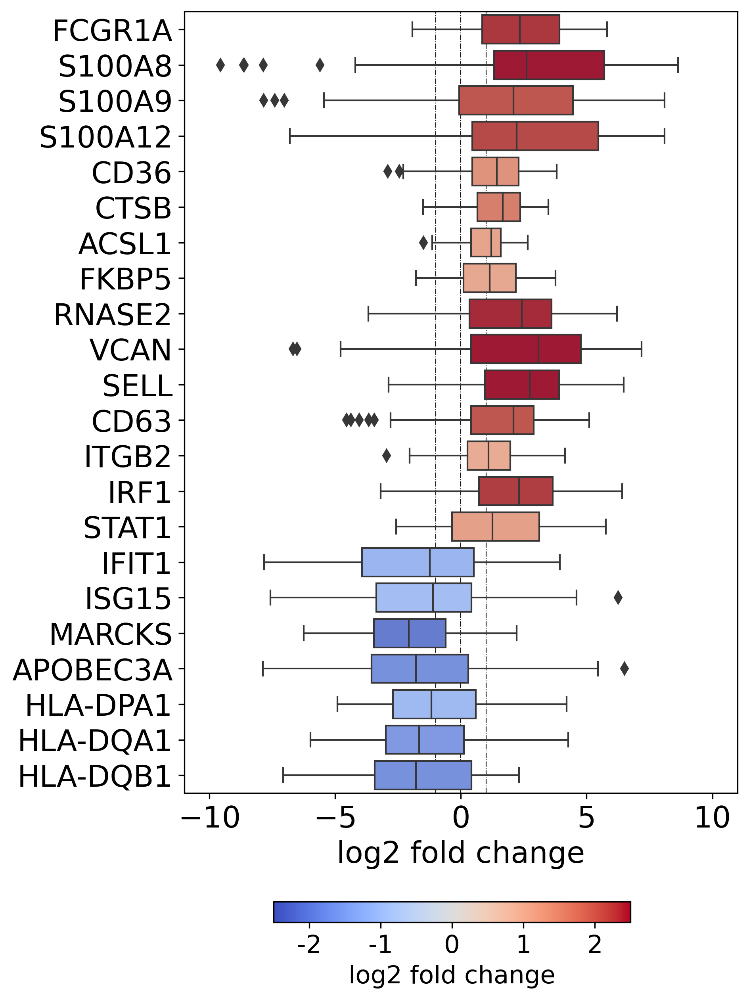

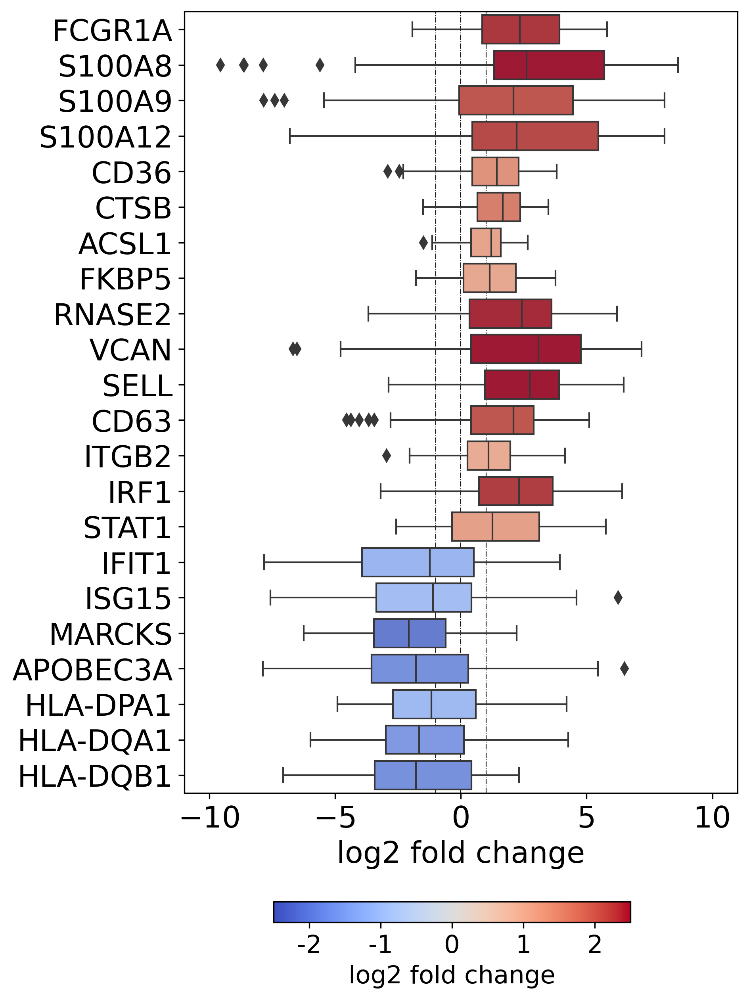

In [12]:
mo_genes = [
            'FCGR1A', 'S100A8', 'S100A9', 'S100A12', 'CD36', 'CTSB', 'ACSL1','FKBP5', 'RNASE2', 
            'VCAN', 'SELL', 'CD63', 'ITGB2',
            'IRF1', 'STAT1',
            'IFIT1', 'ISG15', 'MARCKS', 'APOBEC3A',
            'HLA-DPA1', 'HLA-DQA1', 'HLA-DQB1'   
]
pairwise_boxplot(ct_log2FC, ['Monocytes'], mo_genes, path='box_mo_genes.pdf')
pairwise_boxplot(ct_log2FC, ['Monocytes'], mo_genes, path='box_mo_genes.png')

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


{'figure': <Figure size 1650x4500 with 2 Axes>, 'ax': <AxesSubplot:>}

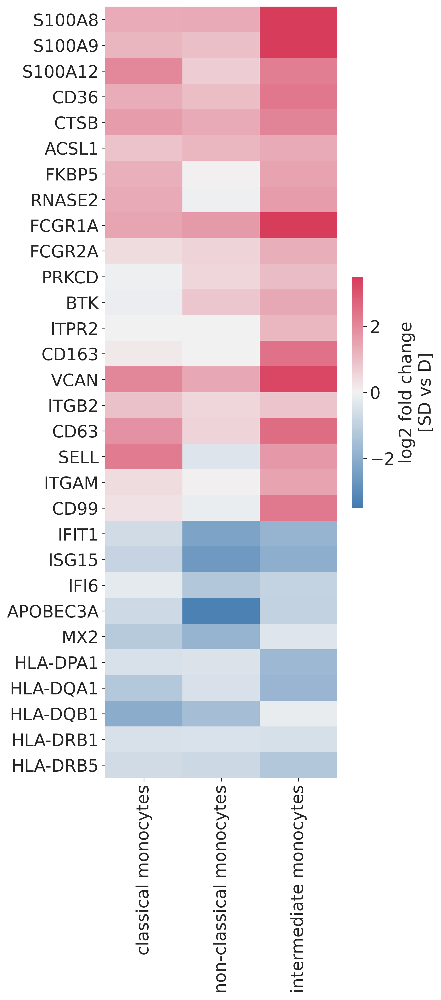

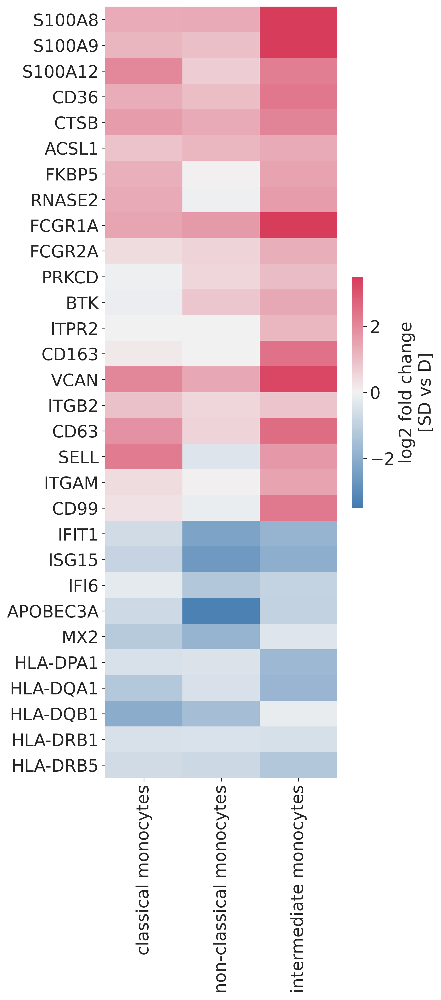

In [21]:
glist = [
       'S100A8', 'S100A9', 'S100A12', 'CD36', 'CTSB', 'ACSL1', 'FKBP5', 'RNASE2','FCGR1A', 
           'FCGR2A', 'PRKCD', 'BTK', 'ITPR2', 'CD163',
       'VCAN', 'CD63', 'SELL', 'ITGB2', 'ITGAM', 'CD99',

       # 'IRF1', 'STAT1',
       'IFIT1', 'ISG15', 'IFI6', 'APOBEC3A', 'MX2', #'RSAD2', 'IFIT3', 'MX1', 
       'HLA-DPA1', 'HLA-DQA1', 'HLA-DQB1', 'HLA-DRB1', 'HLA-DRB5',#'HLA-DMA','HLA-DMB', 'HLA-DPB1', 'HLA-DRA', 
    
]
heatmap_cst(cst_pair, glist, ['classical monocytes', 'non-classical monocytes', 'intermediate monocytes', ], 
            save_fd='mo_cst_heatmap.pdf')
heatmap_cst(cst_pair, glist, ['classical monocytes', 'non-classical monocytes', 'intermediate monocytes'], 
            save_fd='mo_cst_heatmap.png')

## Figure 6

{'figure': <Figure size 1800x3135 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

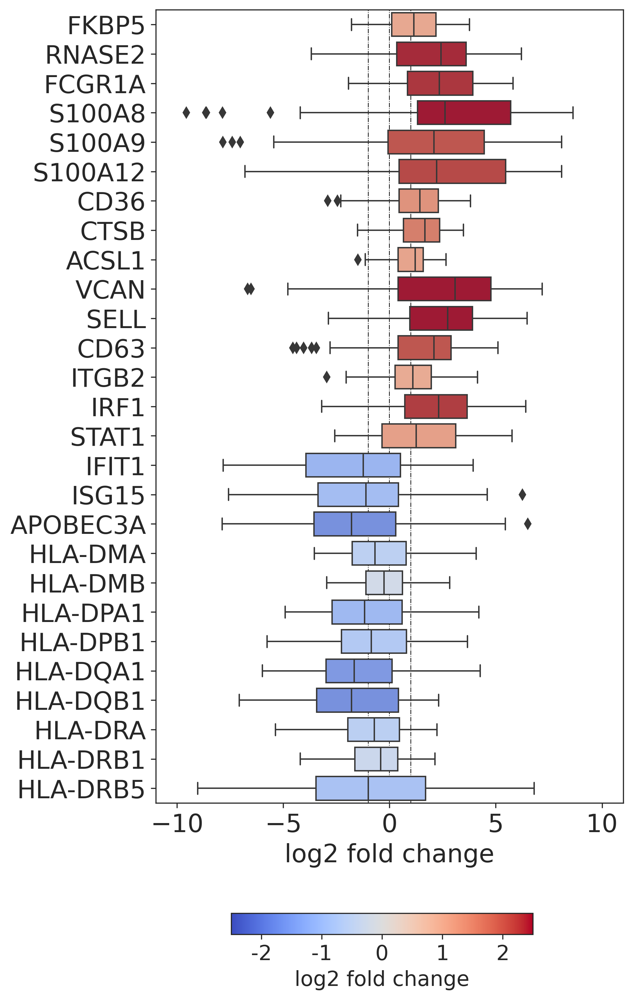

In [43]:
child_genes = [
'FKBP5', 'RNASE2',
            'FCGR1A', 'S100A8', 'S100A9', 'S100A12', 'CD36', 'CTSB', 'ACSL1',
            'VCAN', 'SELL', 'CD63', 'ITGB2',
            'IRF1', 'STAT1',
            'IFIT1', 'ISG15', 'APOBEC3A',
            'HLA-DMA','HLA-DMB', 'HLA-DPA1', 'HLA-DPB1','HLA-DQA1', 'HLA-DQB1','HLA-DRA', 'HLA-DRB1', 'HLA-DRB5'
]
pairwise_boxplot(ct_log2FC, ['Monocytes'], child_genes, path='mo_child.pdf')
pairwise_boxplot(ct_log2FC, ['Monocytes'], child_genes, path='mo_child.png')

{'figure': <Figure size 1800x3135 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

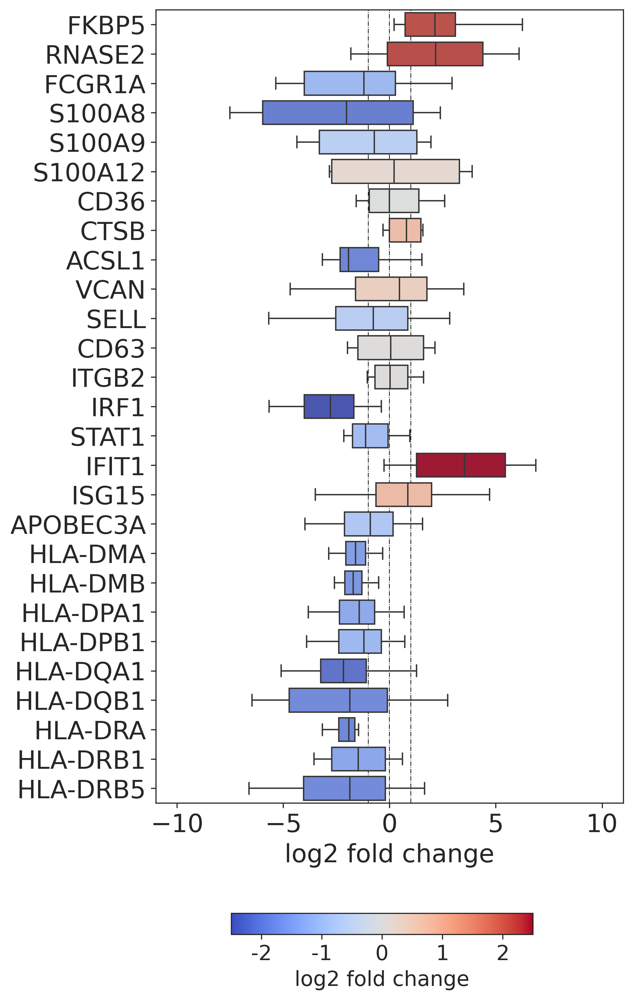

In [42]:
adult_genes = [
'FKBP5', 'RNASE2',
            'FCGR1A', 'S100A8', 'S100A9', 'S100A12', 'CD36', 'CTSB', 'ACSL1',
            'VCAN', 'SELL', 'CD63', 'ITGB2',
            'IRF1', 'STAT1',
            'IFIT1', 'ISG15', 'APOBEC3A',
            'HLA-DMA','HLA-DMB', 'HLA-DPA1', 'HLA-DPB1','HLA-DQA1', 'HLA-DQB1','HLA-DRA', 'HLA-DRB1', 'HLA-DRB5'

]
 
pairwise_boxplot(ct_log2FC_a, ['Monocytes'], adult_genes, path='mo_adult.pdf')
pairwise_boxplot(ct_log2FC_a, ['Monocytes'], adult_genes, path='mo_adult.png')

In [71]:
adata_adult_M = adata_adult[adata_adult.obs.cell_type_new == 'Monocytes']
adata_kid_M = adata_kid[adata_kid.obs.cell_type_new == 'Monocytes']

df, r = pairwise_processing(ct_pair.loc['Monocytes'], ct_pair_a.loc['Monocytes'])
sc.pp.filter_genes(adata_adult_M, min_cells=3)
df = df.loc[[x for x in df.index if x in adata_kid_M.var_names]]

##################################################
mark_list = {}
for m in ['1', '2', '3', '4']:   
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()
    
for m in ['5', '6', '7', '8']:
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()[:3]
mark_list

{'1': ['MTRNR2L12', 'RNASE2', 'FKBP5', 'MT-CYB'],
 '2': ['IFIT1', 'SAMD9', 'EVI2B', 'RHOB'],
 '3': ['HLA-DQA1',
  'HLA-DQB1',
  'SAT1',
  'HLA-DRB5',
  'APOBEC3A',
  'HLA-DPA1',
  'NBPF26',
  'LGALS2',
  'HSP90AA1',
  'CCL3'],
 '4': ['GBP5',
  'IRF1',
  'GBP1',
  'WARS',
  'S100A8',
  'GBP2',
  'SELL',
  'VAMP5',
  'FCGR1A',
  'ACSL1',
  'PIM1',
  'PSME2',
  'BCL2A1',
  'S100A9',
  'GLIPR2',
  'STAT1',
  'APLP2'],
 '5': ['VCAN', 'S100A12', 'CD63'],
 '6': ['COL6A3', 'MTRNR2L8', 'MT-ATP8'],
 '7': ['TRAPPC5', 'RNASEK', 'NDUFA13'],
 '8': ['RGS2', 'FOSB', 'IDO1']}

{'figure': <Figure size 2100x2100 with 1 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change (SD vs D)\nin children', ylabel='log2 fold change (SD vs D)\nin adults'>}

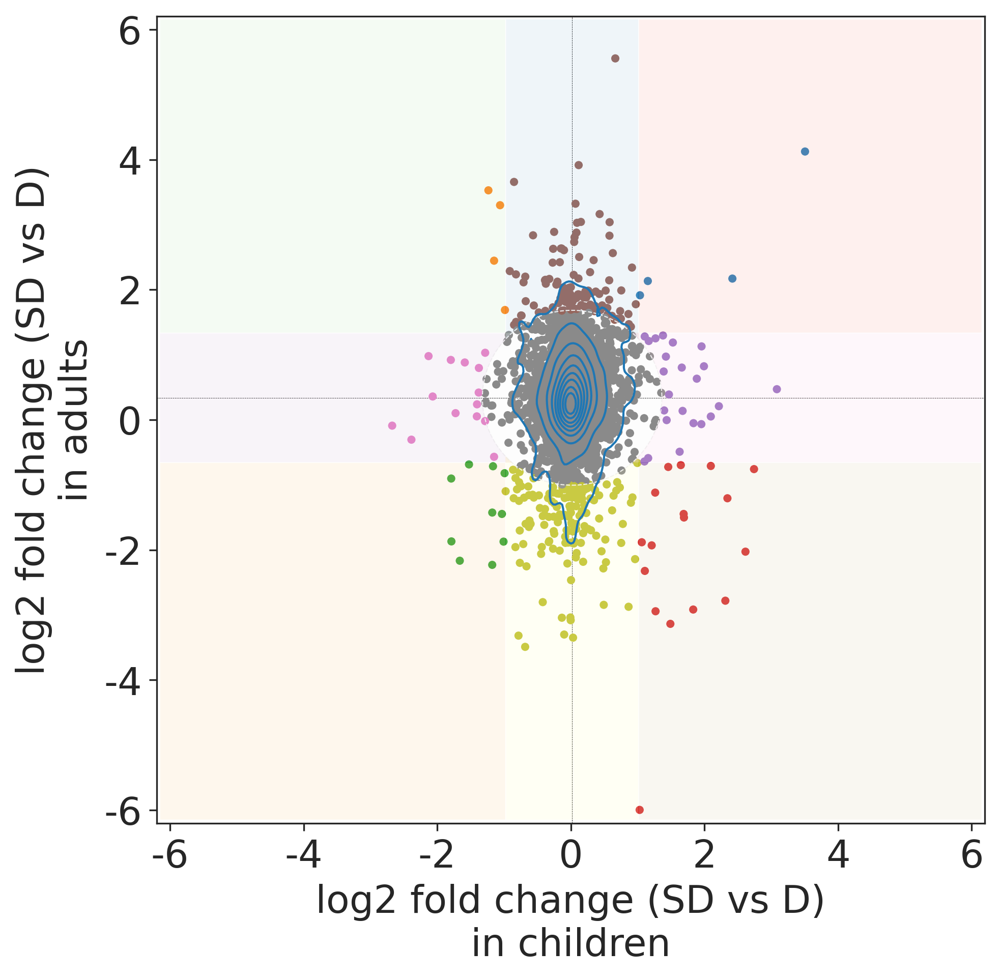

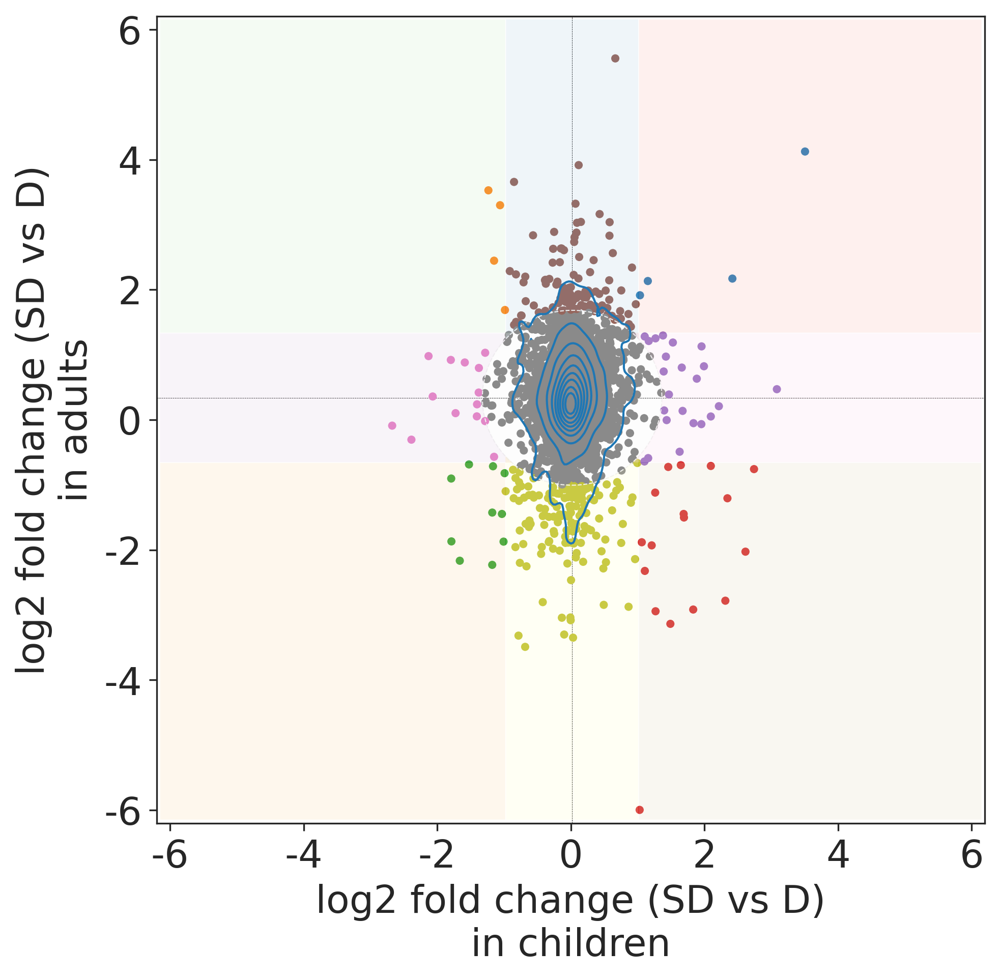

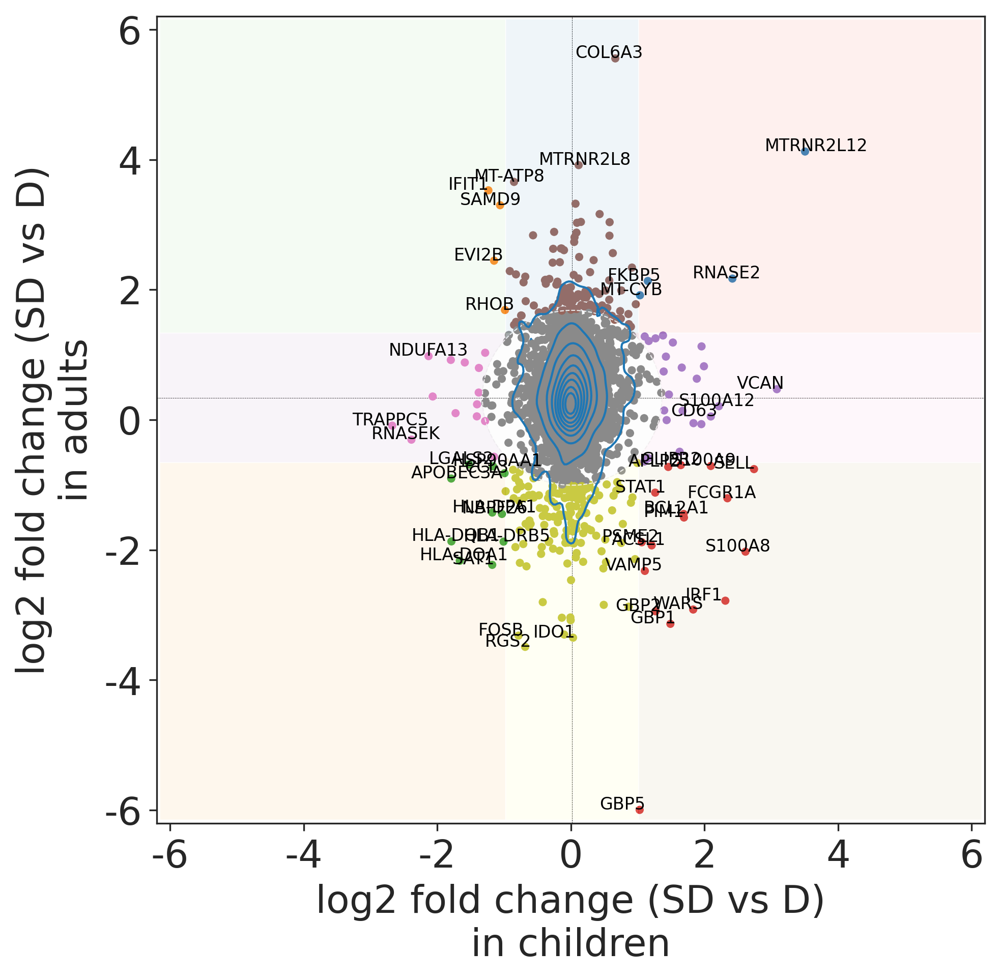

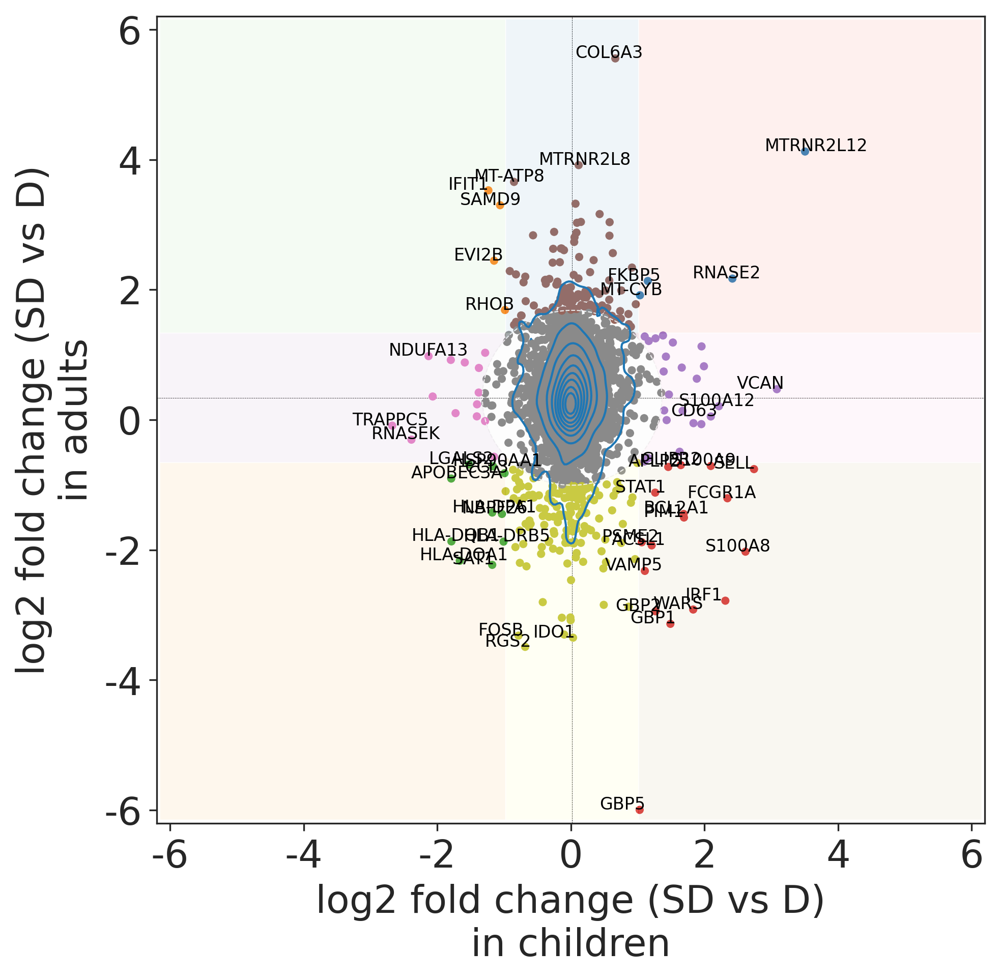

In [73]:
import itertools
marklist = list(itertools.chain.from_iterable(mark_list.values()))

scatter_pairwise(df, r, [], name='DEGs_Monocytes_new.png', xlim=6.2)
scatter_pairwise(df, r, [], name='DEGs_Monocytes_new.pdf', xlim=6.2)

scatter_pairwise(df, r, marklist, name='DEGs_Monocytes.png', xlim=6.2)
scatter_pairwise(df, r, marklist, name='DEGs_Monocytes.pdf', xlim=6.2)

# cDCs

In [1]:
'''
1. define DEGs by both existing in pairwise comparison and ks test
2. we don't have enough cDCs in adult dataset, do I don't plot child vs adult data

'''

'\ndefine DEGs by both existing in pairwise comparison and ks test\n\n'

In [184]:
pair_DCs_up = ct_pair.loc['conventional DCs'][(ct_pair.loc['conventional DCs']['med_pair'] >= 1)].sort_values('med_pair', ascending=False)

ks_DCs_idx_up = ((ct_pair.loc['conventional DCs']['log2_fold_change'] >= 1)
            & (ct_pair.loc['conventional DCs']['pvalue_corrected'] <= 0.05))
ks_DCs_up = ct_pair.loc['conventional DCs'].loc[ks_DCs_idx_up]

DCs_up = set(ks_DCs_up.index.tolist()) & set(pair_DCs_up.index.tolist())

In [185]:
pair_DCs_down = ct_pair.loc['conventional DCs'][(ct_pair.loc['conventional DCs']['med_pair'] <= -1)].sort_values('med_pair', ascending=False)

ks_DCs_idx_down = ((ct_pair.loc['conventional DCs']['log2_fold_change'] <= -1)
            & (ct_pair.loc['conventional DCs']['pvalue_corrected'] <= 0.05))
ks_DCs_down = ct_pair.loc['conventional DCs'].loc[ks_DCs_idx_down]

DCs_down = set(ks_DCs_down.index.tolist()) & set(pair_DCs_down.index.tolist())

In [186]:
DCs_up

{'ACTR2',
 'ACTR3',
 'ADPGK',
 'AHNAK',
 'ANP32B',
 'ANP32E',
 'ARHGEF1',
 'ASAH1',
 'ATP6AP2',
 'ATP6V1B2',
 'BAG6',
 'BCLAF1',
 'BNIP3L',
 'BZW1',
 'C12orf57',
 'C15orf39',
 'CAP1',
 'CAPN2',
 'CAPZA1',
 'CAPZA2',
 'CAT',
 'CBX3',
 'CCT7',
 'CCT8',
 'CD164',
 'CD36',
 'CDKN2D',
 'CMPK1',
 'CMPK2',
 'CMTM6',
 'CNDP2',
 'CSF3R',
 'CUL1',
 'CYBB',
 'DCTN1',
 'DDIT4',
 'EIF2AK2',
 'EIF3A',
 'EIF3M',
 'EIF4B',
 'EIF4G2',
 'EIF5A',
 'ELOC',
 'ELOVL5',
 'ETS2',
 'EZR',
 'FAM49B',
 'FBP1',
 'FBXL5',
 'FBXO7',
 'FLOT2',
 'GDI2',
 'GHITM',
 'GLUD1',
 'GLUL',
 'GNPDA1',
 'HADHA',
 'HDAC1',
 'HIST1H1D',
 'HMGB2',
 'HNRNPH1',
 'HNRNPK',
 'HSPD1',
 'ID2',
 'IFI27',
 'IFI27L2',
 'IFITM3',
 'IL10RA',
 'ILF3',
 'IQGAP1',
 'ITGB1',
 'ITGB2',
 'ITGB7',
 'JAK2',
 'KHDRBS1',
 'KLF10',
 'KPNB1',
 'LBR',
 'LCP1',
 'LCP2',
 'LDHA',
 'LIMS1',
 'LTA4H',
 'M6PR',
 'MAN2B1',
 'MBNL1',
 'METAP2',
 'MSN',
 'MT2A',
 'MVP',
 'MYCBP2',
 'MYD88',
 'NAMPT',
 'NAPSA',
 'NCOA4',
 'NRROS',
 'NUCB1',
 'OCIAD1',
 'PABPC1',

In [187]:
DCs_down

{'CRIP1',
 'CSNK2B',
 'EEF1G',
 'FCER1A',
 'HLA-DQA1',
 'NDUFA11',
 'PSMA1',
 'RNASEK',
 'RPS10',
 'RPS17',
 'TRAPPC5'}

{'figure': <Figure size 1800x2505 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

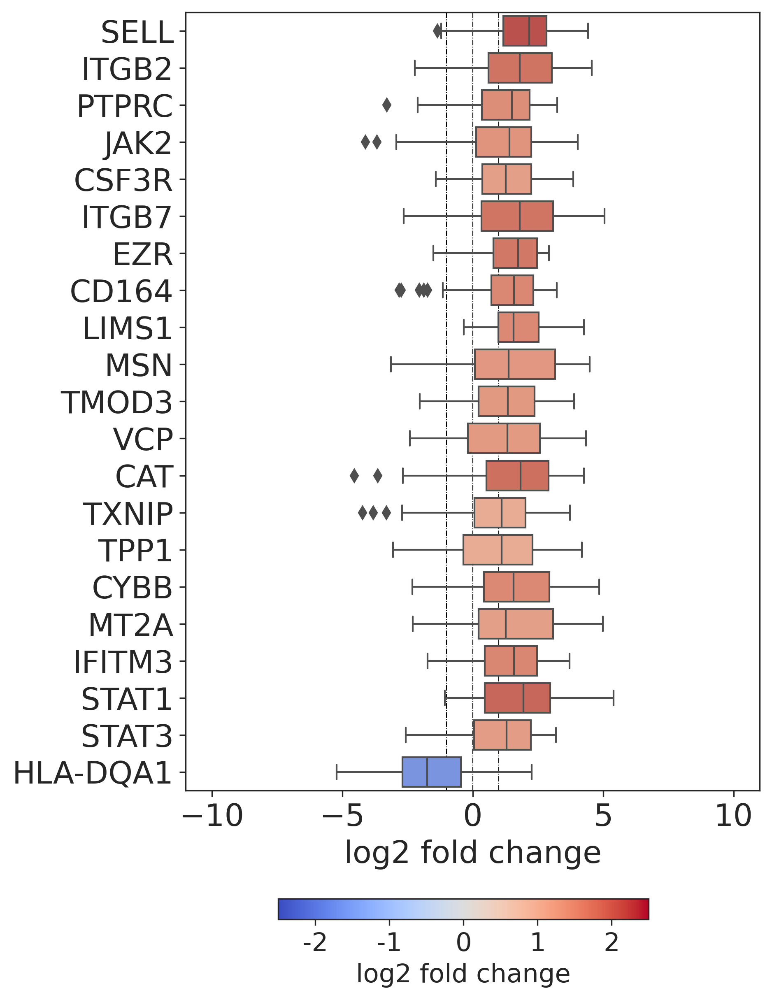

In [247]:
cDC_genes = [
    'SELL', 'ITGB2', 'PTPRC', 'JAK2', 'CSF3R',  
    'ITGB7', 'EZR', 'CD164', 'LIMS1',  'MSN', 'TMOD3', 'VCP',  # leukocyte migration and adhesion
    'CAT', 'TXNIP', 'TPP1', 'CYBB', 'MT2A', # stress response
    'IFITM3', 'STAT1', 'STAT3', # viral response
    'HLA-DQA1',
]
pairwise_boxplot(ct_log2FC, ['conventional DCs'], cDC_genes, path='box_cDC_genes.pdf')
# pairwise_boxplot(ct_log2FC, ['T cells'], mo_genes, path='box_T_genes.png')

{'figure': <Figure size 1200x3450 with 2 Axes>, 'ax': <AxesSubplot:>}

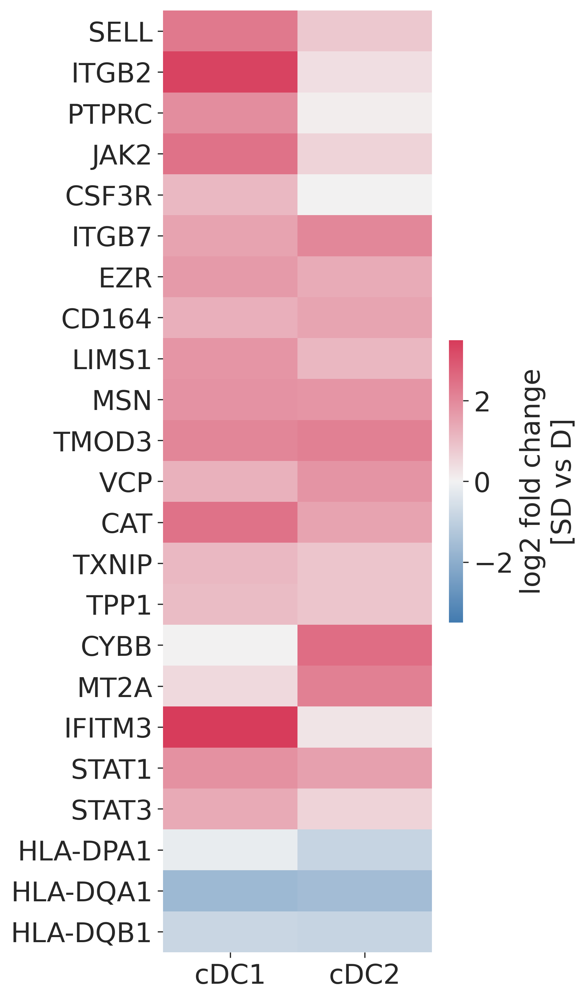

In [246]:
glist = [
    'SELL', 'ITGB2', 'PTPRC', 'JAK2', 'CSF3R',  
    'ITGB7', 'EZR', 'CD164', 'LIMS1',  'MSN', 'TMOD3', 'VCP',  # leukocyte migration and adhesion
    'CAT', 'TXNIP', 'TPP1', 'CYBB', 'MT2A', # stress response
    'IFITM3', 'STAT1', 'STAT3', # viral response
    'HLA-DPA1', 'HLA-DQA1', 'HLA-DQB1'
]
heatmap_cst(cst_pair, glist, ['cDC1', 'cDC2'], 
            save_fd='cDC_cst_heatmap.pdf')
# heatmap_cst(cst_pair, glist, ['classical monocytes', 'non-classical monocytes', 'intermediate monocytes'], 
#             save_fd='T_cst_heatmap.png')

# plasmablasts

## Figure 4

In [ ]:
ks_idx = ((ct_pair['log2_fold_change'] >= 1) | (ct_pair['log2_fold_change'] <= -1)) & (-np.log10(ct_pair['pvalue']) > 5)
pair_idx = (
    ((ct_pair['med_pair'] >= 1) &  (ct_pair['fra_pair'] >= (39 / 56))) |
    ((ct_pair['med_pair'] <= -1) &  (ct_pair['neg_fra_pair'] >= (39 / 56)))
)
ct_DEGs = ct_pair[ks_idx & pair_idx]

ct_DEGs_P = ct_DEGs.loc['Plasmablasts']

In [ ]:
Plasma_genes = [ 
    'IGHM', 'IGHD', 'IGHG3', 'IGHG1', 'IGHA1', 'IGHG2', 'IGHG4', 'IGHE', 'IGHA2', 
#     'MYDGF', 'IL17A', 'IL17B','IL17C','IL17D','IL12A', 'EBI3', 'IL10', 'TNF', 'TGFB1', 'CSF2', 'IL1B', 
    #Plasma Cells, the Next Generation: Beyond Antibody Secretion
#     'AICDA',
    'CCNC', 'CCND2',
    'COPG1', 'SEC14L1', 'SEC23B', 'SEC31A', 'SEC62', 
    'EEF2', 'EIF4G1', 'EIF4G2', 'ELL2', 
#     'XBP1', 'ERN1', 'EIF2AK3', 'ATF4', 'ATF6', 'DDIT3', 'DDIT4','COPE', 
#         'IGHG1', 'IGHG2', 'IGHA1', 'IGHA2', 'IGHG3', 'IGHG4', 
               ]
pairwise_boxplot(ct_log2FC, ['Plasmablasts'], Plasma_genes, path='box_Plasma_genes.pdf', xlim=12.5) # 
pairwise_boxplot(ct_log2FC, ['Plasmablasts'], Plasma_genes, path='box_Plasma_genes.png', xlim=12.5)

In [ ]:
if False:
    glist = [
    'IGHM', 'IGHD', 'IGHG3', 'IGHG1', 'IGHA1', 'IGHG2', 'IGHG4', 'IGHE', 'IGHA2', 
#     'MYDGF', 'IL17A', 'IL17B','IL17C','IL17D','IL12A', 'EBI3', 'IL10', 'TNF', 'TGFB1', 'CSF2', 'IL1B', 
    #Plasma Cells, the Next Generation: Beyond Antibody Secretion
#     'AICDA',
    'CCNC', 'CCND2',
    'COPG1', 'SEC14L1', 'SEC23B', 'SEC31A', 'SEC62', 
    'EEF2', 'EIF4G1', 'EIF4G2', 'ELL2', 
    ]
    
    heatmap_cst(cst_pair, glist, ['proliferating plasmablasts', 'non-proliferating plasmablasts'], 
                save_fd='Plasma_cst_heatmap.pdf')
    heatmap_cst(cst_pair, glist, ['proliferating plasmablasts', 'non-proliferating plasmablasts'], 
                save_fd='Plasma_cst_heatmap.png')

In [13]:
df, r = pairwise_processing(cst_pair.loc['proliferating plasmablasts'], 
                            cst_pair.loc['non-proliferating plasmablasts'])
adata_kid_P = adata_kid[adata_kid.obs.cell_type_new == 'Plasmablasts']
adata_kid_P = removegenes(adata_kid_P)
sc.pp.filter_genes(adata_kid_P, min_cells=3)
df = df.loc[[x for x in df.index if x in adata_kid_P.var_names]]

In [19]:
mark_list = {}
for m in ['1', '2', '3', '4']:   
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()

for m in ['5', '6', '7', '8']:
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()[:3]
    
mark_list

{'1': ['MTRNR2L12',
  'IGHG3',
  'IGHG4',
  'ELL2',
  'RNF213',
  'PCBP1',
  'CCNC',
  'SYNE2',
  'STT3A',
  'GANAB',
  'CCND2',
  'PIM2',
  'STAT1',
  'ENTPD1',
  'COPG1'],
 '2': [],
 '3': ['EEF1G',
  'MT-ATP8',
  'CRIP1',
  'CSNK2B',
  'PTPRCAP',
  'RNASEK',
  'CD59',
  'UBE2V1',
  'RPL17',
  'ARPC1B',
  'MRPS24',
  'S100A4',
  'RPS17',
  'S100A6',
  'ECH1',
  'NDUFA13',
  'ARL6IP1',
  'TRAPPC5',
  'AKAP2',
  'IGHA1',
  'CORO1A',
  'CD79A',
  'LIMD2'],
 '4': [],
 '5': ['PRDM1', 'TRAM2', 'PIM1'],
 '6': ['SEL1L3', 'PABPC1', 'EIF4G2'],
 '7': ['C11orf98', 'MYCBP', 'PSMA2'],
 '8': ['HLA-DPA1', 'EEF1D', 'FOS']}

/tmp/ipykernel_60907/693501954.py:278: RuntimeWarning: invalid value encountered in arcsin
  angles = np.array([np.arcsin(1/radius), np.arccos(1/radius), np.pi-np.arccos(1/radius),
/tmp/ipykernel_60907/693501954.py:278: RuntimeWarning: invalid value encountered in arccos
  angles = np.array([np.arcsin(1/radius), np.arccos(1/radius), np.pi-np.arccos(1/radius),
/tmp/ipykernel_60907/693501954.py:279: RuntimeWarning: invalid value encountered in arcsin
  np.pi - np.arcsin(1/radius), np.pi+np.arcsin(1/radius),
/tmp/ipykernel_60907/693501954.py:280: RuntimeWarning: invalid value encountered in arccos
  np.pi+np.arccos(1/radius), 2*np.pi-np.arccos(1/radius),
/tmp/ipykernel_60907/693501954.py:281: RuntimeWarning: invalid value encountered in arcsin
  2*np.pi-np.arcsin(1/radius)])
/tmp/ipykernel_60907/693501954.py:278: RuntimeWarning: invalid value encountered in arcsin
  angles = np.array([np.arcsin(1/radius), np.arccos(1/radius), np.pi-np.arccos(1/radius),
/tmp/ipykernel_60907/693501954.py:27

{'figure': <Figure size 2100x2100 with 1 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change (SD vs D)\nin children', ylabel='log2 fold change (SD vs D)\nin adults'>}

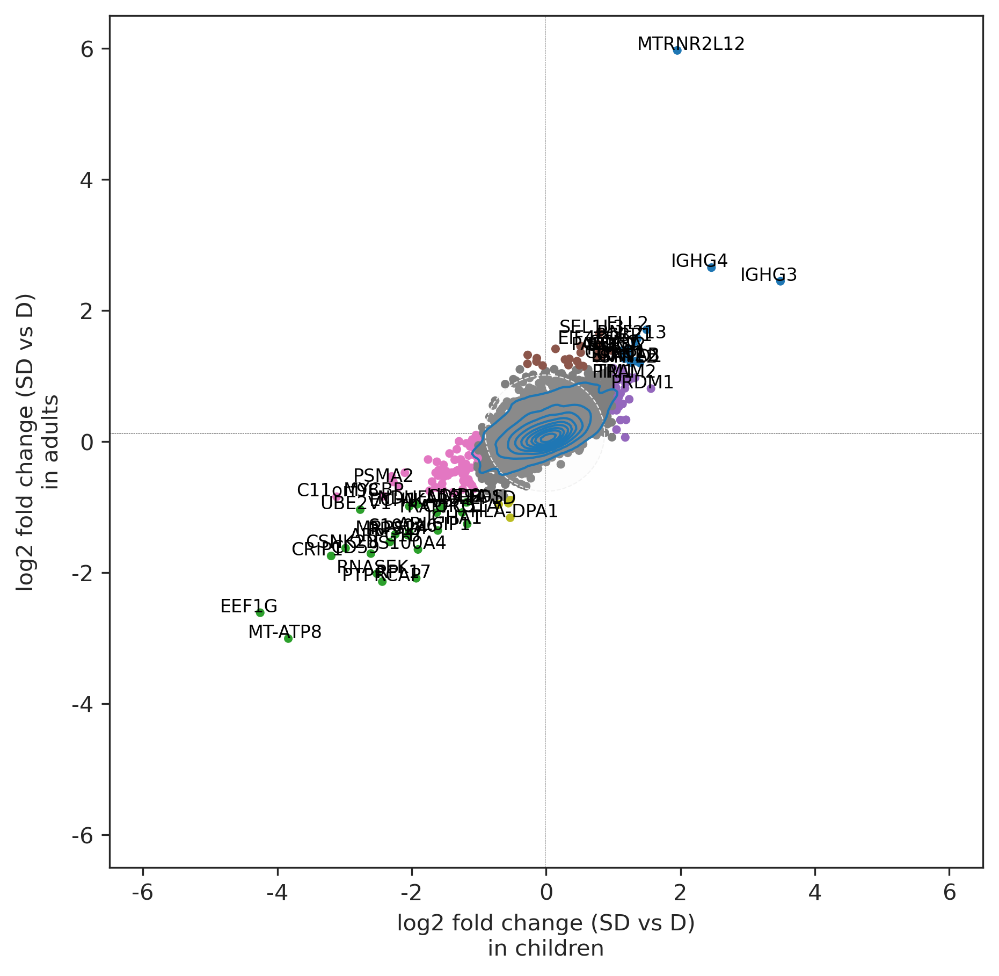

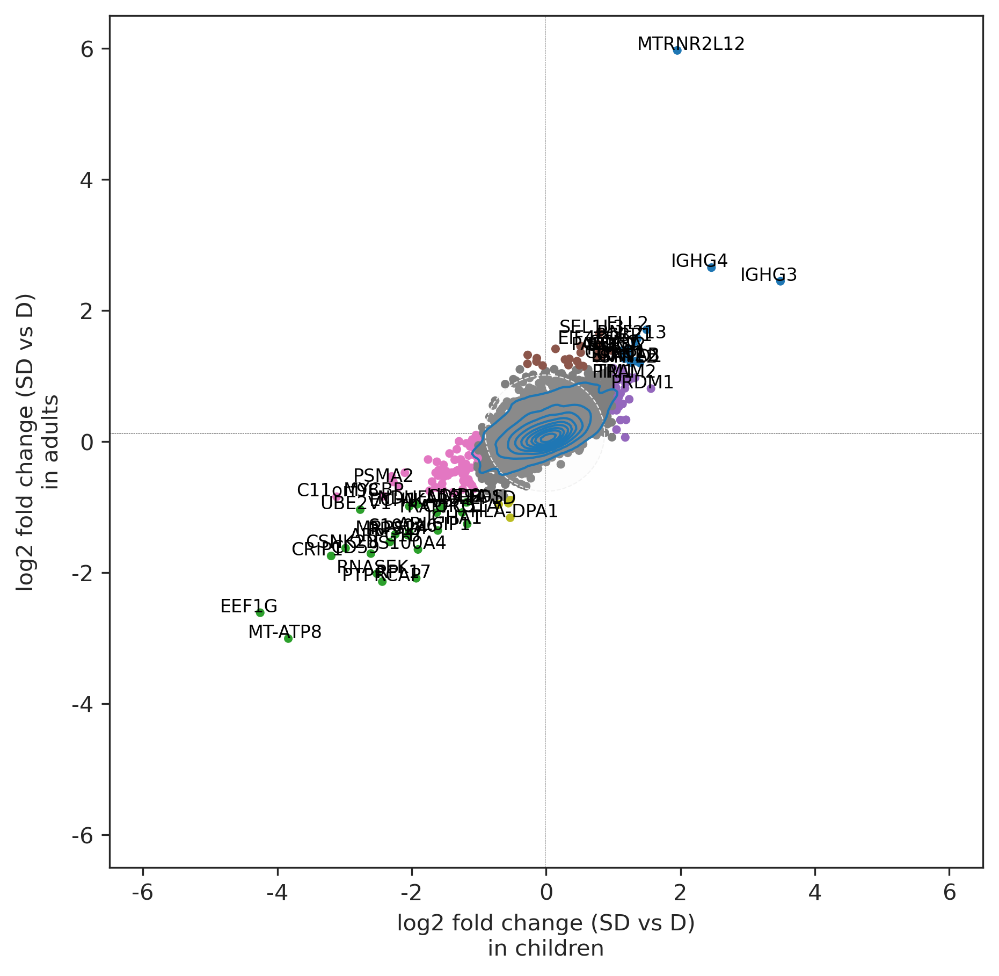

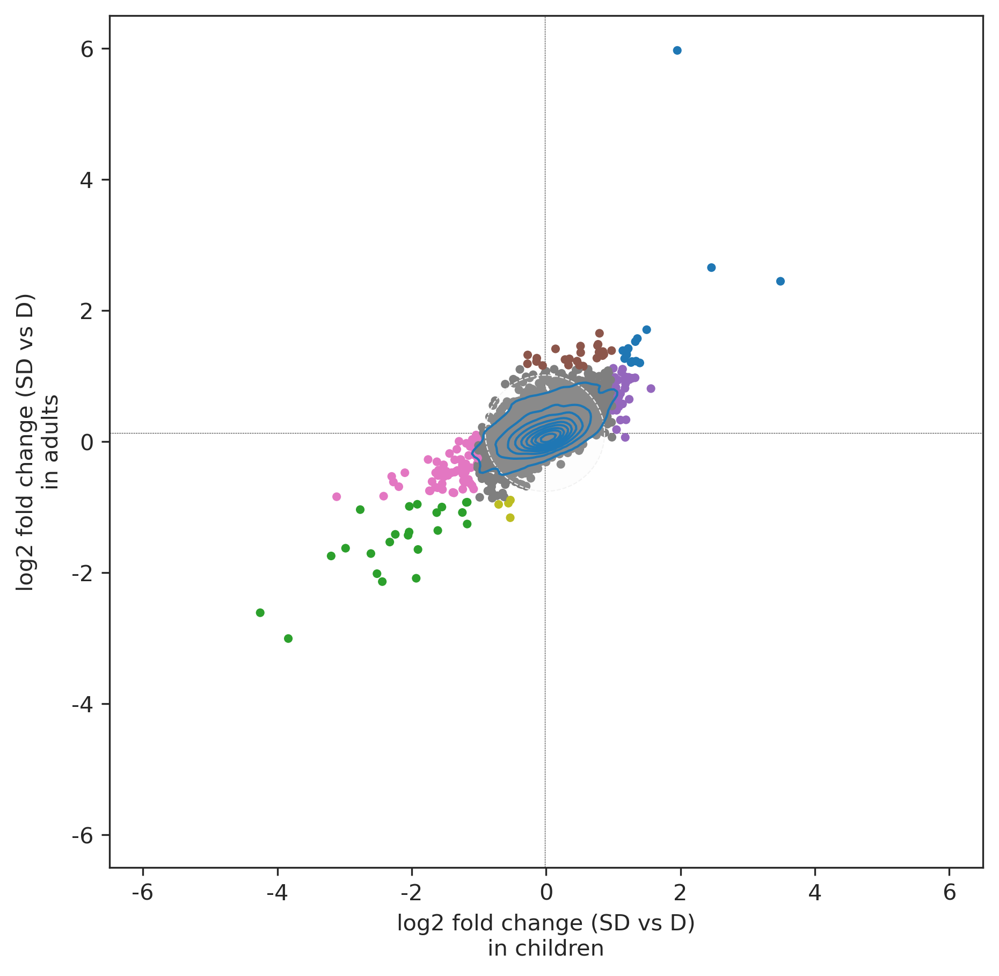

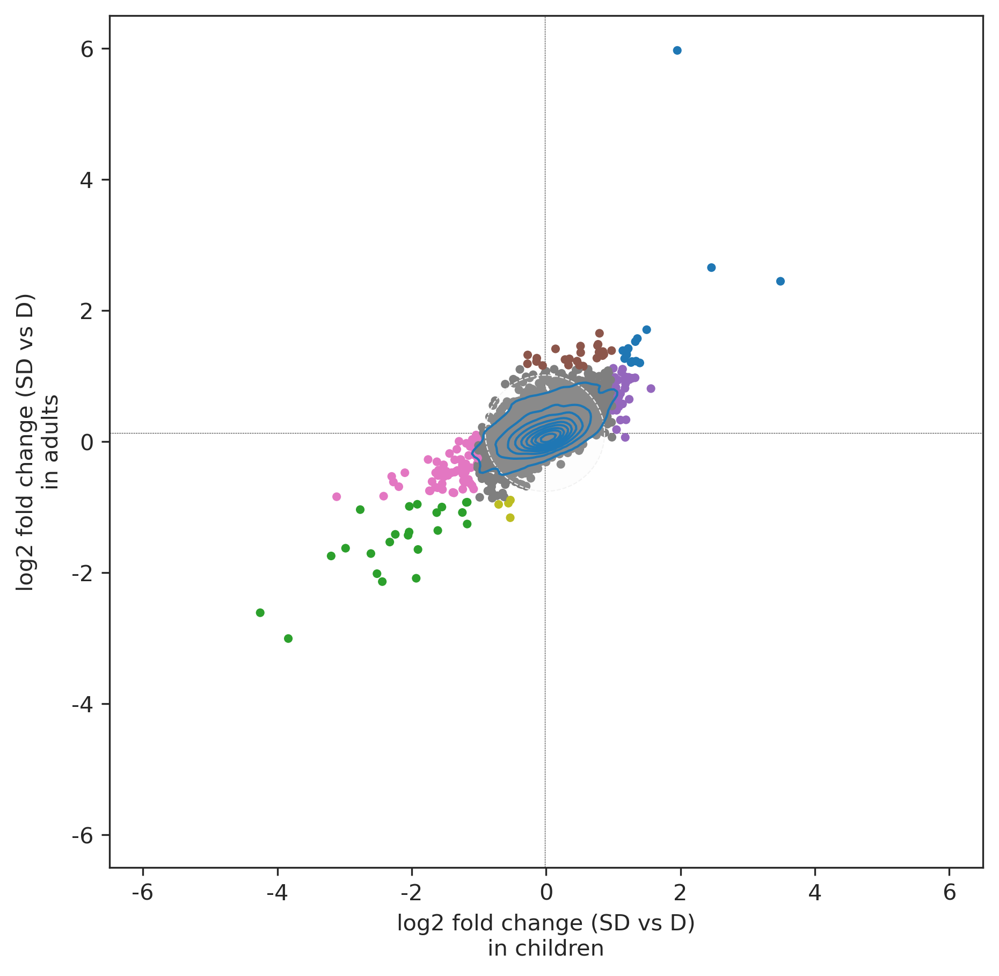

In [23]:
# correlation between subtypes of plasmabalsts

import itertools
marklist = list(itertools.chain.from_iterable(mark_list.values()))

scatter_pairwise(df, r, marklist, name='DEGs_Plasma_subtypes.pdf', xlim=6.5)
scatter_pairwise(df, r, marklist, name='DEGs_Plasma_subtypes.png', xlim=6.5)

scatter_pairwise(df, r, [], name='DEGs_Plasma_subtypes_new.pdf', xlim=6.5)
scatter_pairwise(df, r, [], name='DEGs_Plasma_subtypes_new.png', xlim=6.5)

###################################################################
df['markers2'] = 'no'
mark_list = (df[(df['x'] > 0) & (df['y'] > 0)].sort_values('r').tail(5).index.tolist() + 
            df[(df['x'] < 0) & (df['y'] < 0)].sort_values('r').tail(5).index.tolist())
df.loc[mark_list, 'markers2'] = 'yes'

scatter_pairwise2(df, mark_list, name='DEGs_Plasma_subtypes_1.pdf', xlim=6.5)
scatter_pairwise2(df, mark_list, name='DEGs_Plasma_subtypes_1.png', xlim=6.5)

scatter_pairwise2(df, [], name='DEGs_Plasma_subtypes_2.pdf', xlim=6.5)
scatter_pairwise2(df, [], name='DEGs_Plasma_subtypes_2.png', xlim=6.5)

## Figure 6

In [ ]:
 child_genes =  [
          'IGHM', 'IGHD', 'IGHG3', 'IGHG1', 'IGHA1', 'IGHG2', 'IGHG4', 'IGHE', 'IGHA2', 
             'COPG1', 'SEC23B', 'SEC31A', 'SEC62', # 'COPA', 'COPB1', #'SEC63',
             'CCNC', 'CCND2',
        'EIF4G1', 'EIF4G2', 'ELL2', #'EIF4E',

               ]
pairwise_boxplot(ct_log2FC, ['Plasmablasts'], child_genes, path='Plasma_child.pdf', xlim=12.5)
pairwise_boxplot(ct_log2FC, ['Plasmablasts'], child_genes, path='Plasma_child.png', xlim=12.5)

In [ ]:
adult_genes =  [
          'IGHM', 'IGHD', 'IGHG3', 'IGHG1', 'IGHA1', 'IGHG2', 'IGHG4', 'IGHE', 'IGHA2',
            'CCNC', 'CCND2',
             'COPG1', 'SEC23B', 'SEC31A', 'SEC62', # 'COPA', 'COPB1', #'SEC63',
        'EIF4G1', 'EIF4G2', 'ELL2', #'EIF4E',
               ]
pairwise_boxplot(ct_log2FC_a, ['Plasmablasts'], adult_genes, path='Plasma_adult.pdf')
pairwise_boxplot(ct_log2FC_a, ['Plasmablasts'], adult_genes, path='Plasma_adult.png')

In [78]:
df, r = pairwise_processing(ct_pair.loc['Plasmablasts'], ct_pair_a.loc['Plasmablasts'])
adata_kid_P = adata_kid[adata_kid.obs.cell_type_new == 'Plasmablasts']
adata_kid_P = removegenes(adata_kid_P)
sc.pp.filter_genes(adata_kid_P, min_cells=3)
df = df.loc[[x for x in df.index if x in adata_kid_P.var_names]]

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'figure': <Figure size 2100x2100 with 1 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change (SD vs D)\nin children', ylabel='log2 fold change (SD vs D)\nin adults'>}

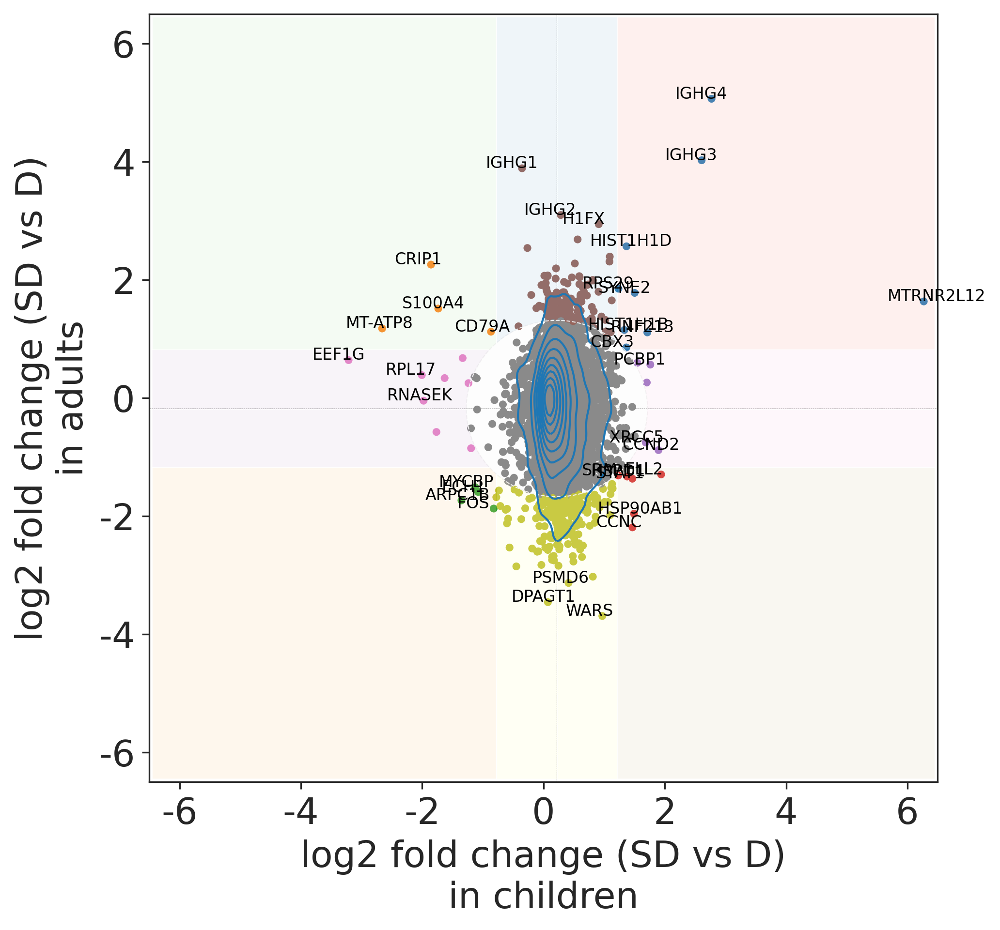

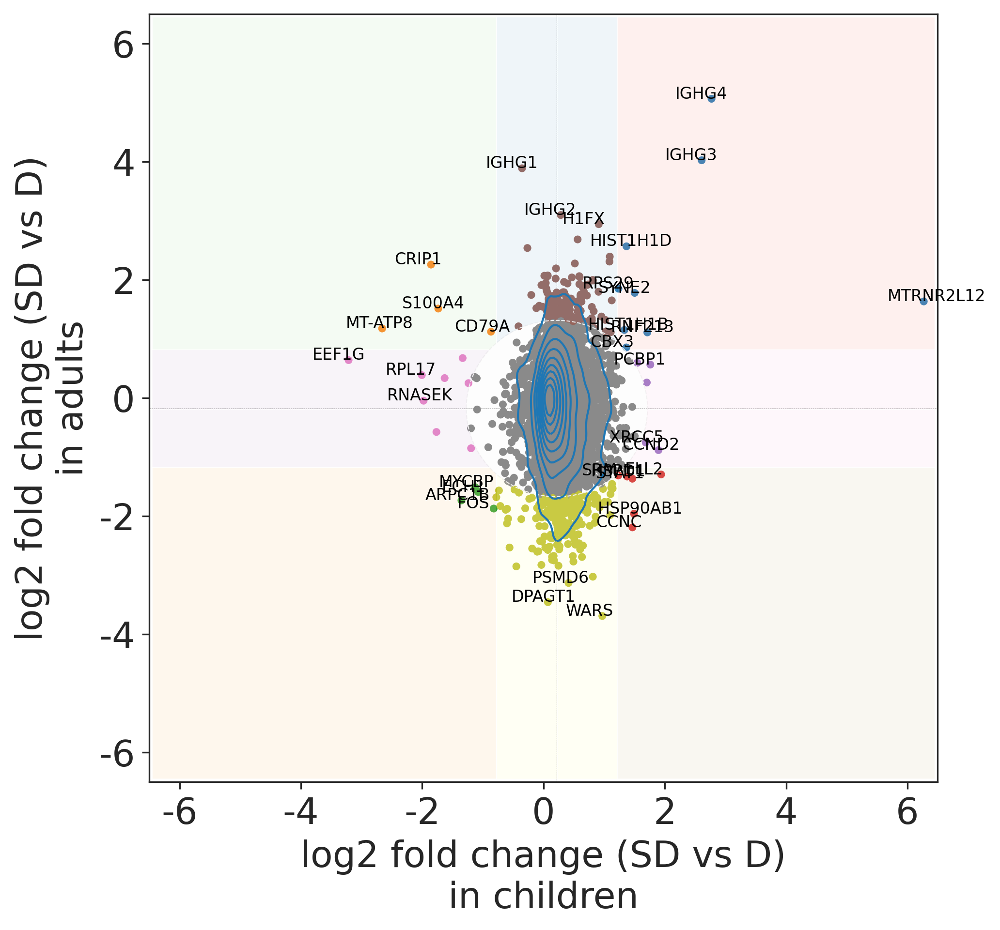

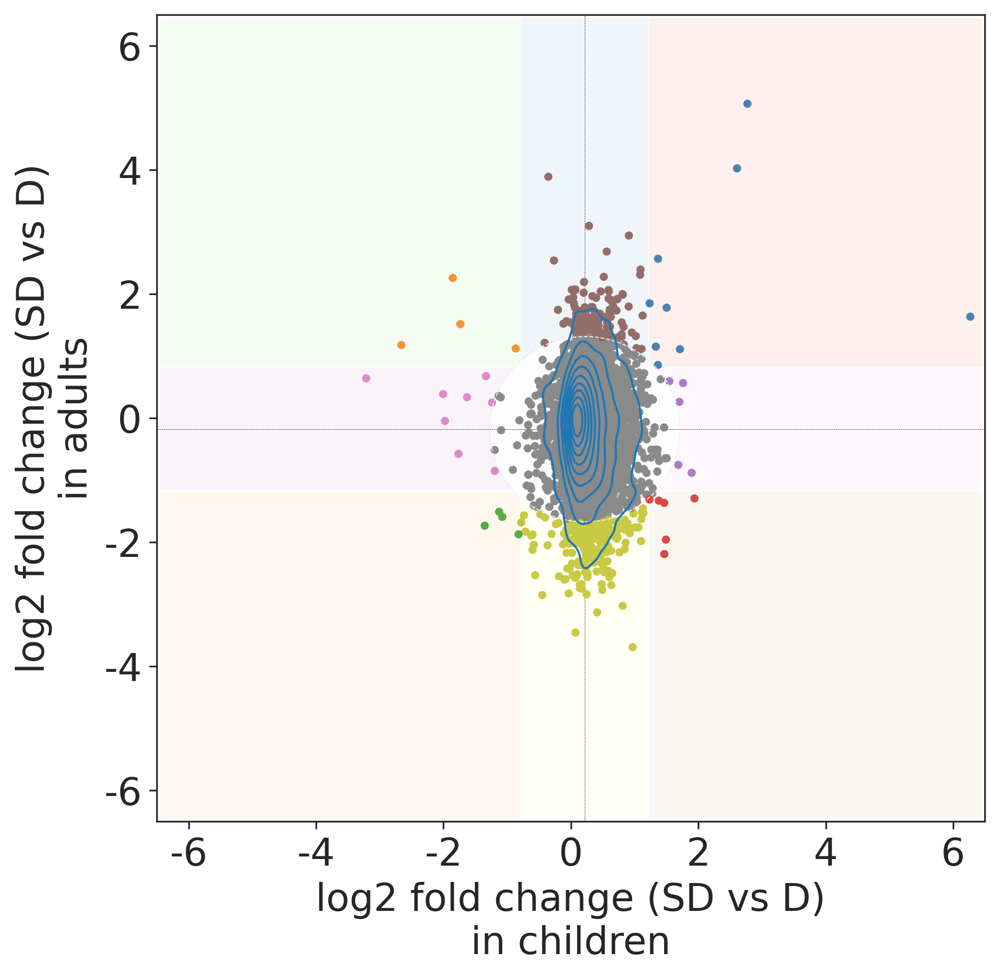

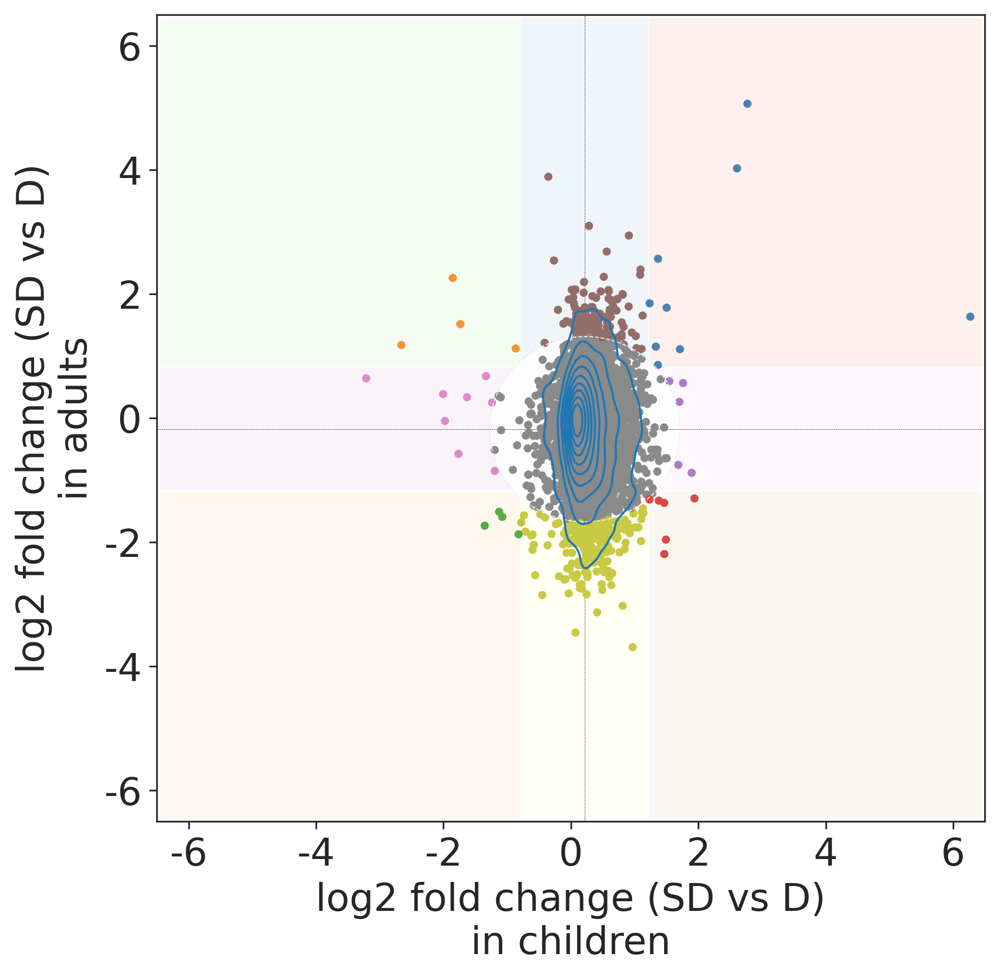

In [81]:
mark_list = {}
for m in ['1', '2', '3', '4']:   
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()

for m in ['5', '6', '7', '8']:
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()[:3]
    
mark_list

import itertools
marklist = list(itertools.chain.from_iterable(mark_list.values()))

scatter_pairwise(df, r, marklist, name='DEGs_Plasma.png', xlim=6.5)
scatter_pairwise(df, r, marklist, name='DEGs_Plasma.pdf', xlim=6.5)

scatter_pairwise(df, r, [], name='DEGs_Plasma_new.png', xlim=6.5)
scatter_pairwise(df, r, [], name='DEGs_Plasma_new.pdf', xlim=6.5)

# NK cells

In [ ]:
# panel A
NK_genes = [
    'HLA-DRB1', 'HLA-DPA1', 'HLA-DPB1',  'CCL5', 'IL32','CD2','ITGB1',  # NK activation
    'CAPN2','LCP1', 'ADD3', # cytoskeleton
    'PABPC1', 'PCBP1', 'CSDE1', 'HSPA5', 'HSP90AB1', # translation
    'LAG3', # immunosuppression
    'LY6E', 'ISG15', 'IFI6', # ISG
     #'XCL1', 'CCL4', # cytokines 
    'KLRB1', # Cytotoxity inhibition 
]

pairwise_boxplot(ct_log2FC, ['NK cells'], NK_genes, path='box_NK_genes.pdf')
pairwise_boxplot(ct_log2FC, ['NK cells'], NK_genes, path='box_NK_genes.png')

In [ ]:
# Panel B
glist = [ 
    'HLA-DRB1', 'HLA-DPA1', 'HLA-DPB1', 'CCL5', 'ITGB1',  # NK activation
    'CAPN2','LCP1', 'ADD3', # cytoskeleton
    'PABPC1', 'PCBP1', 'CSDE1', 'HSPA5', 'HSP90AB1', # translation
    'LAG3', # immunosuppression
    'LY6E', 'ISG15', 'IFI6', # ISG
     #'XCL1', 'CCL4', # cytokines 
    'IL32', 'CD2','KLRC3', 'GZMH', 'GZMK', 'KLRC2', 'KLRC1', # upregulation in adaptive NK cells
    'KLRF1', 'GZMA','GNLY', 'FCER1G', 'KLRB1', # downregulation in adaptive NK cells
]

heatmap_cst(cst_pair, glist, ['cytotoxic NK cells', 'signaling NK cells'], save_fd='NK_cst_heatmap.pdf')
heatmap_cst(cst_pair, glist, ['cytotoxic NK cells', 'signaling NK cells'], save_fd='NK_cst_heatmap.png')

In [ ]:
# panel C fraction of KLRC2 cytotoxic NK cells in IDs
fras = {}

adata_temp = adata_kid[(adata_kid.obs['ID'] != '1_075_01') & (adata_kid.obs['ID'] != '6_029_01')]
for cd in ['S_dengue', 'dengue']:
    fras[cd] = []
    temp = adata_temp[(adata_temp.obs['cell_subtype_new'] == 'cytotoxic NK cells') & 
                     (adata_temp.obs['Condition'] == cd)]
    IDs = temp.obs['ID'].unique()
    for ID in IDs:
        adata_ID = temp[temp.obs['ID'] == ID]
        plus = (adata_ID[:, 'KLRC2'].X > 0).sum()
        fra = plus / adata_ID.obs.shape[0] * 100
        fras[cd].append(fra)
        
df = pd.DataFrame()
df['fra'] = fras['dengue'] + fras['S_dengue']
df['Condition'] =  ['D'] * len(fras['dengue']) + ['SD'] * len(fras['S_dengue']) 

#################

fras_a = {}
#################
adata_temp = adata_adult
for cd in ['S_dengue', 'dengue']:
    fras_a[cd] = []
    temp = adata_temp[(adata_temp.obs['cell_subtype_new'] == 'cytotoxic NK cells') & 
                     (adata_temp.obs['Condition'] == cd)]
    IDs = temp.obs['ID'].unique()
    for ID in IDs:
        adata_ID = temp[temp.obs['ID'] == ID]
        plus = (adata_ID[:, 'KLRC2'].X > 0).sum()
        fra = plus / adata_ID.obs.shape[0] * 100
        fras_a[cd].append(fra)

df_a = pd.DataFrame()
df_a['fra'] = fras['dengue'] + fras['S_dengue'] + fras_a['dengue'] + fras_a['S_dengue']
df_a['Condition'] =  ['D'] * len(fras['dengue']) + ['SD'] * len(fras['S_dengue']) + ['D_a'] * len(fras_a['dengue']) + ['SD_a'] * len(fras_a['S_dengue'])

########## plot
KLRC2_plus(df_a)

In [ ]:
from scipy.stats import ks_2samp
ks_2samp(df[df['Condition'] =='SD']['fra'], df[df['Condition'] =='D']['fra'])

In [ ]:
from scipy.stats import f_oneway
f_oneway(df[df['Condition'] =='SD']['fra'], df[df['Condition'] =='D']['fra'])

In [ ]:
from scipy.stats import ttest_ind
ttest_ind(df[df['Condition'] =='SD']['fra'], df[df['Condition'] =='D']['fra'])

## Figure 6

In [ ]:
child_genes = [
    'LAG3',
    'IL32', 'KLRC3', 'CD2','GZMH','GZMK', 'KLRC2',  'KLRC1', # upregulation in adaptive NK cells
    'KLRF1', 'GZMA','GNLY',  'FCER1G', 'KLRB1', # downregulation in adaptive NK cell
]
pairwise_boxplot(ct_log2FC, ['NK cells'], child_genes, path='NK_child.pdf')
pairwise_boxplot(ct_log2FC, ['NK cells'], child_genes, path='NK_child.png')

In [ ]:
adult_genes = [
    'LAG3',
    'IL32', 'KLRC3', 'CD2','GZMH','GZMK', 'KLRC2',  'KLRC1', # upregulation in adaptive NK cells
    'KLRF1', 'GZMA','GNLY',  'FCER1G', 'KLRB1', # downregulation in adaptive NK cell
]
 
pairwise_boxplot(ct_log2FC_a, ['NK cells'], adult_genes, path='NK_adult.pdf')
pairwise_boxplot(ct_log2FC_a, ['NK cells'], adult_genes, path='NK_adult.png')

In [56]:
df, r = pairwise_processing(ct_pair.loc['NK cells'], ct_pair_a.loc['NK cells'])
adata_kid_NK = adata_kid[adata_kid.obs.cell_type_new == 'NK cells']
adata_kid_NK = removegenes(adata_kid_NK)
sc.pp.filter_genes(adata_kid_NK, min_cells=3)
df = df.loc[[x for x in df.index if x in adata_kid_NK.var_names]]

{'figure': <Figure size 2100x2100 with 1 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change (SD vs D)\nin children', ylabel='log2 fold change (SD vs D)\nin adults'>}

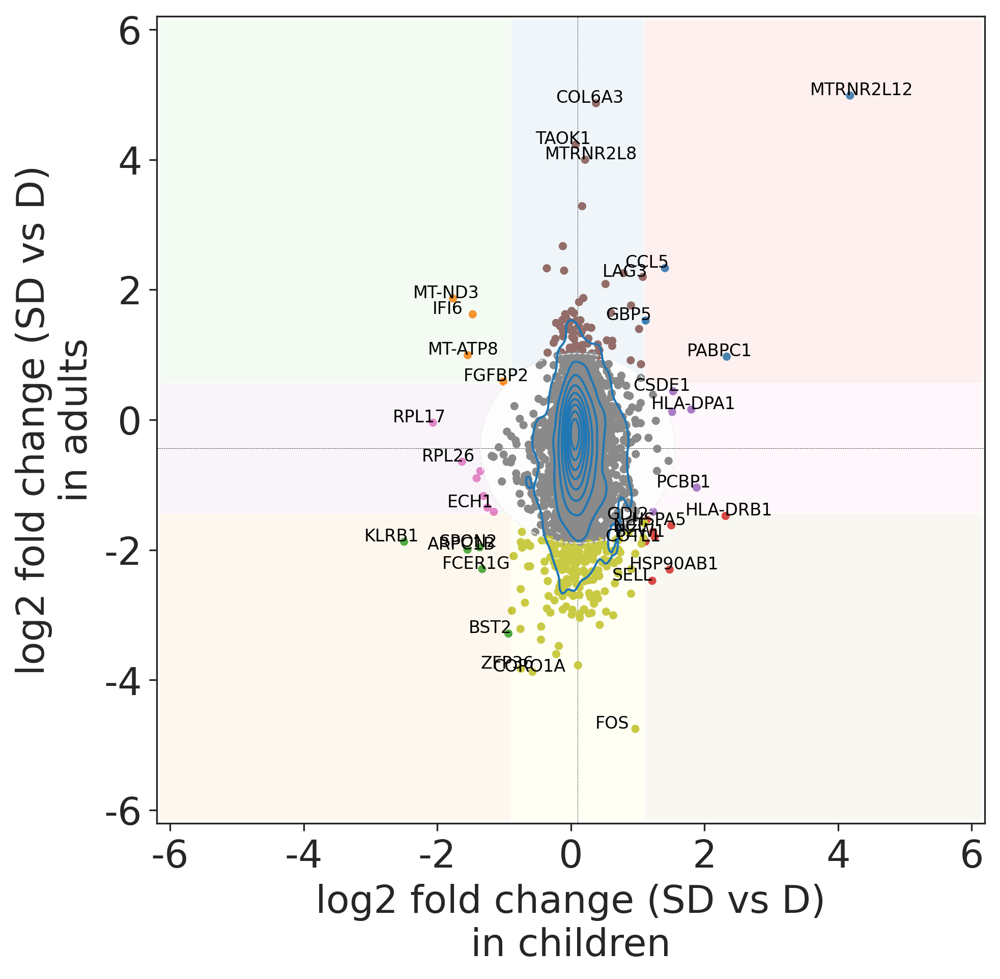

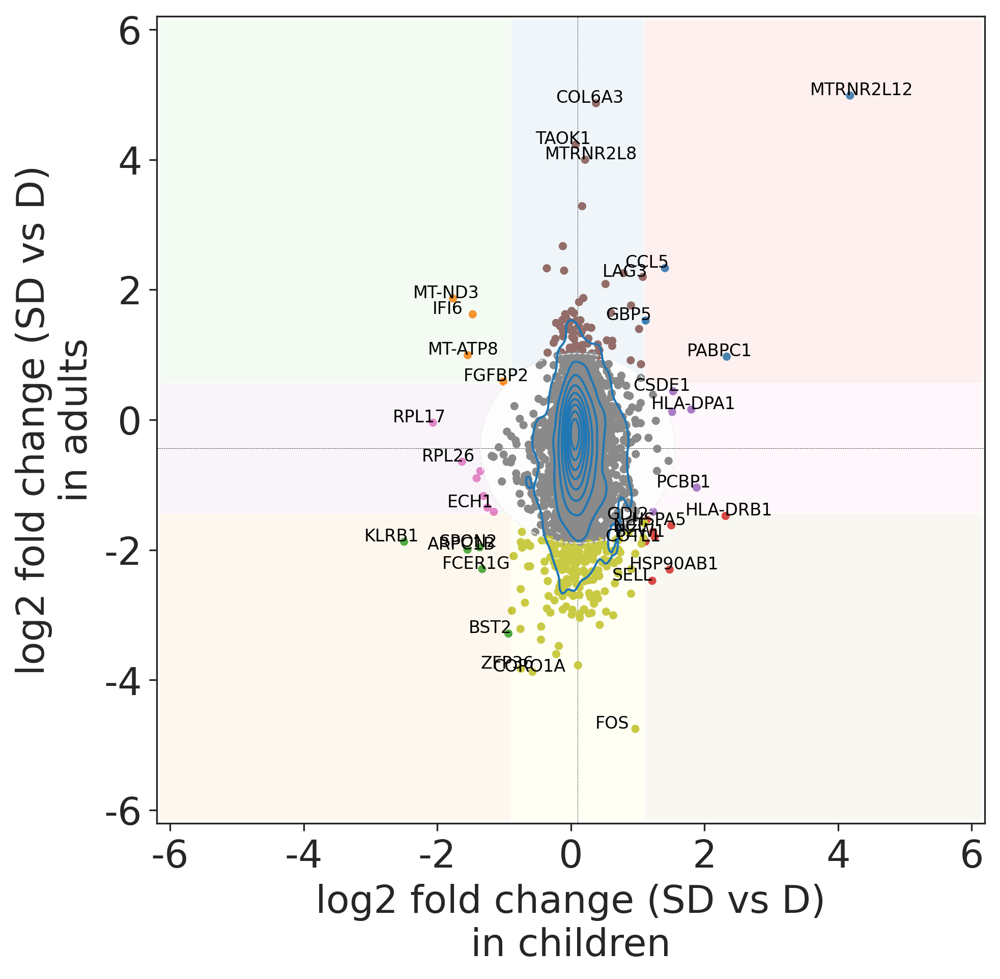

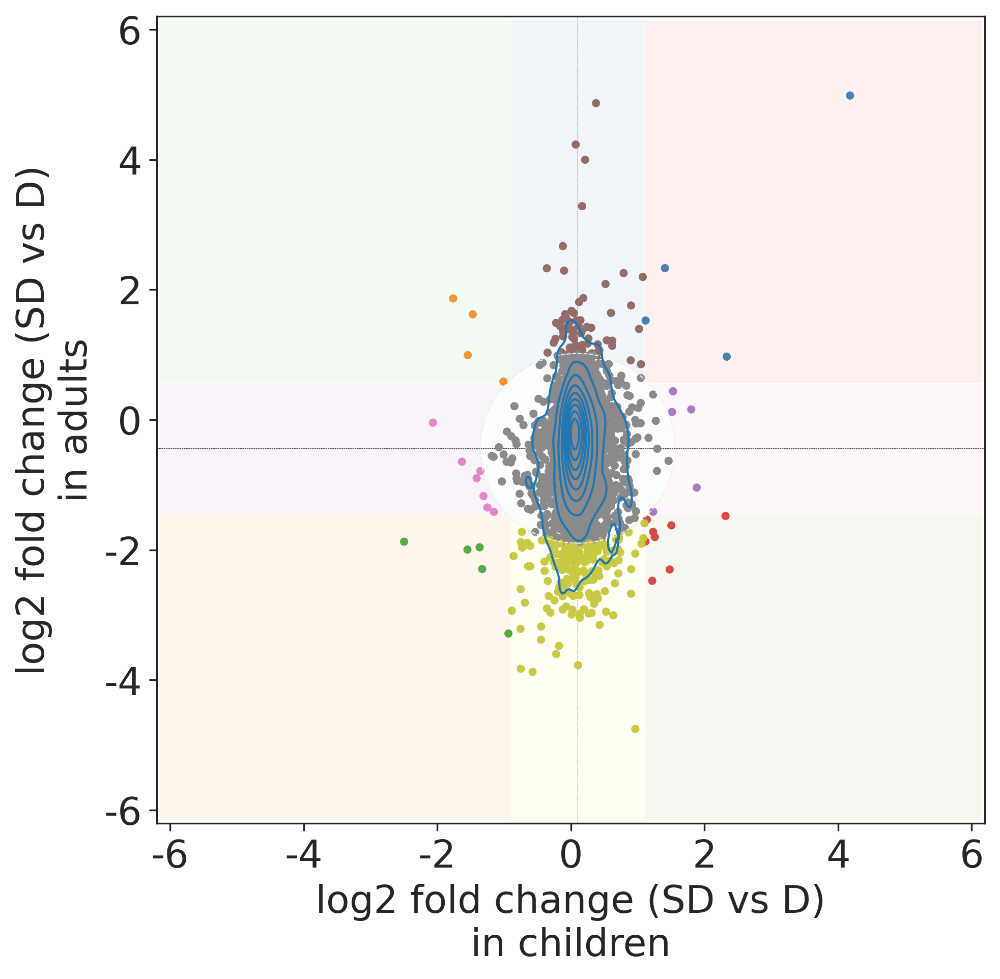

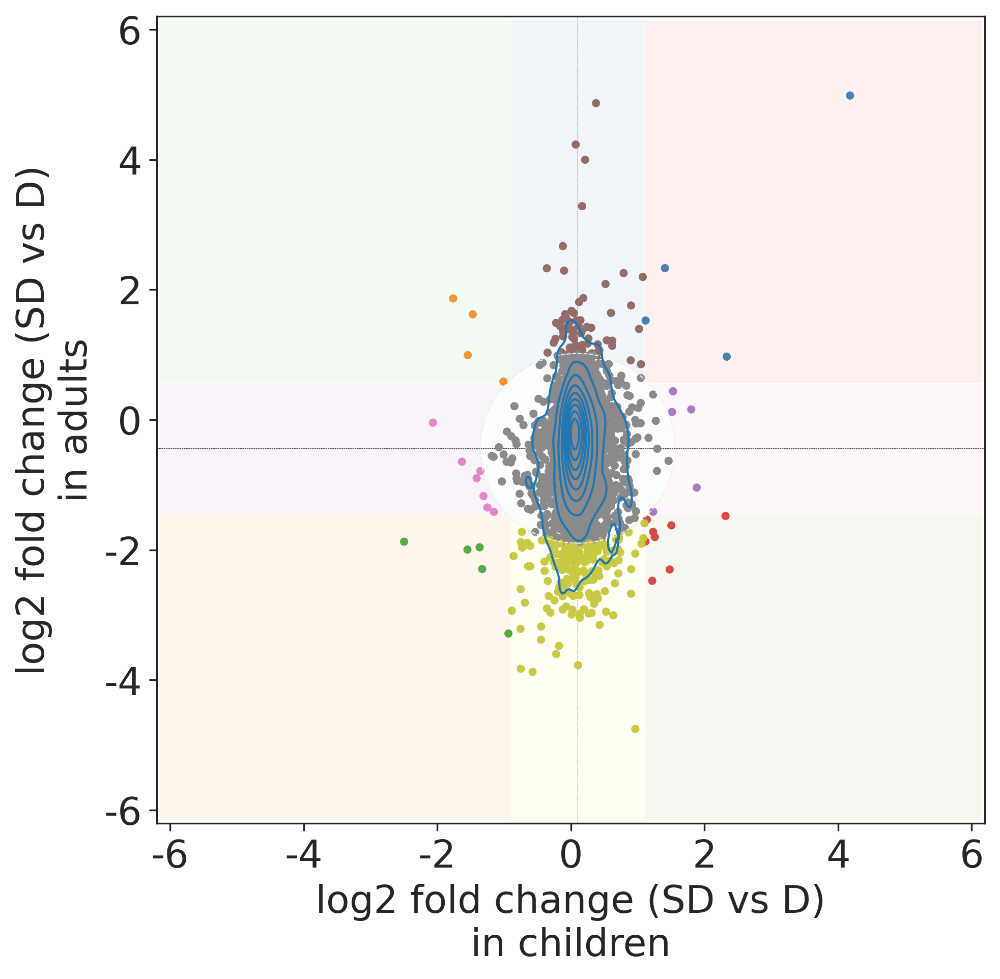

In [60]:
mark_list = {}
for m in ['1', '2', '3', '4']:   
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()

for m in ['5', '6', '7', '8']:
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()[:3]
    
mark_list

import itertools
marklist = list(itertools.chain.from_iterable(mark_list.values())) + ['LAG3']

scatter_pairwise(df, r, marklist, name='DEGs_NK.png', xlim=6.2)
scatter_pairwise(df, r, marklist, name='DEGs_NK.pdf', xlim=6.2)

scatter_pairwise(df, r, [], name='DEGs_NK_new.png', xlim=6.2)
scatter_pairwise(df, r, [], name='DEGs_NK_new.pdf', xlim=6.2)

# T cells

## Figure 4

In [85]:
ct_pair.loc['T cells'][(ct_pair.loc['T cells']['med_pair'] >= 1) | 
                       (ct_pair.loc['T cells']['med_pair'] <= -1)].sort_values('med_pair', ascending=False).index

Index(['MTRNR2L12', 'PCBP1', 'PABPC1', 'CSDE1', 'LCP1', 'PTPRC', 'CDC25B',
       'EEF2', 'ARHGEF1', 'NCL', 'IFITM3', 'ATP1A1', 'PIM1', 'SEPT9',
       'HSP90AB1', 'SELL', 'RBL2', 'CAPN2', 'SLC44A2', 'GDI2', 'AL138963.3',
       'CD52', 'NDUFA13', 'ISG15', 'DRAP1', 'MT2A', 'MT-ND1', 'MT-ND4L',
       'IL32', 'LY6E', 'RPL26', 'IFI6', 'MT-ND3', 'MT-ATP8', 'RPL17',
       'PTPRCAP'],
      dtype='object', name='gene')

In [39]:
# ATP biosynthetic process: MT-ATP8,MT-ND1,MT-ND3,MT-ND4L,NDUFA13
# translation: EEF2, PABPC1, PCBP1, HSP90AB1
# Cytokine Signaling in Immune system: IFI6,MT2A,PIM1,IL32,ISG15,IFITM3,LY6E, PTPRC
# Exhaustion: LAG3, CTLA4, FOXP3, HAVCR2,

{'figure': <Figure size 1800x2085 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

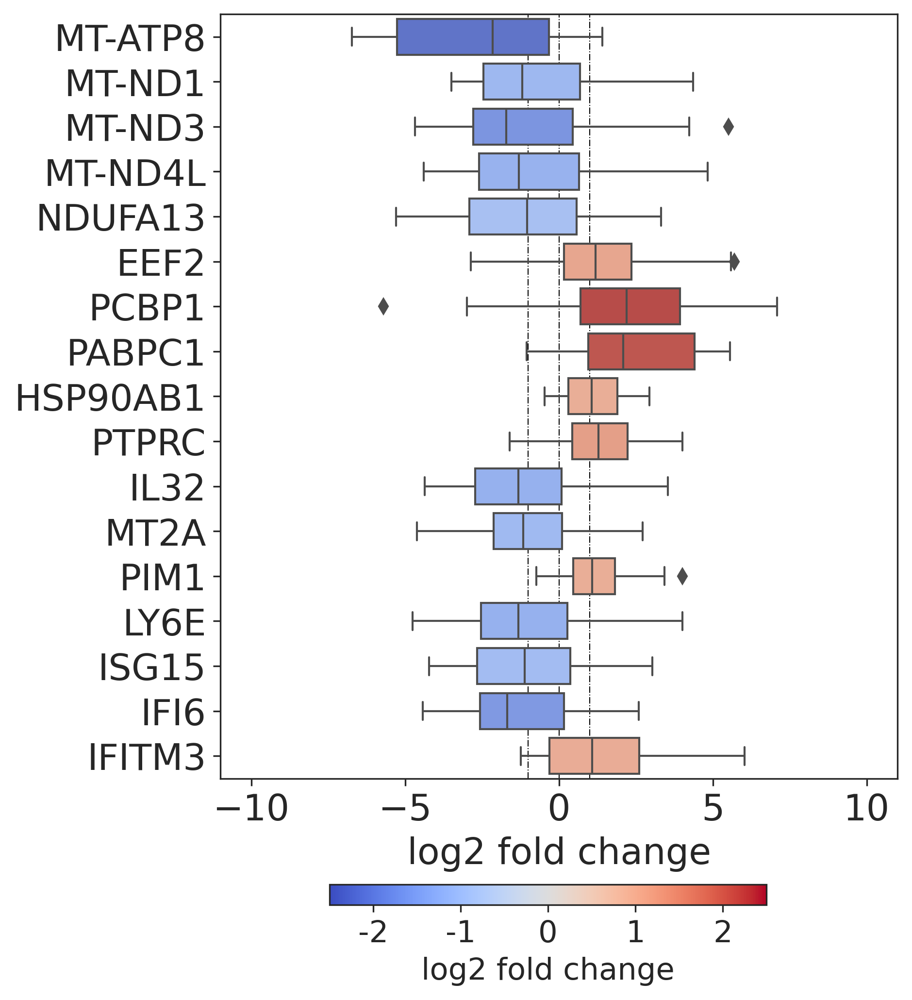

In [94]:
T_genes = [
    'MT-ATP8','MT-ND1','MT-ND3','MT-ND4L','NDUFA13', # ATP biosynthesis
    'EEF2', 'PCBP1', 'PABPC1', 'HSP90AB1', # translation
    'PTPRC', 'IL32',# T cell activation
    'MT2A','PIM1', # T cell survival
    'LY6E', 'ISG15','IFI6','IFITM3',  # ISGs
#     'CTLA4', 'LAG3', 'TIGIT', 'HAVCR2', 'PDCD1', #'FOXP3',
]
pairwise_boxplot(ct_log2FC, ['T cells'], T_genes, path='box_T_genes.pdf')
# pairwise_boxplot(ct_log2FC, ['T cells'], mo_genes, path='box_T_genes.png')

{'figure': <Figure size 3450x3300 with 2 Axes>, 'ax': <AxesSubplot:>}

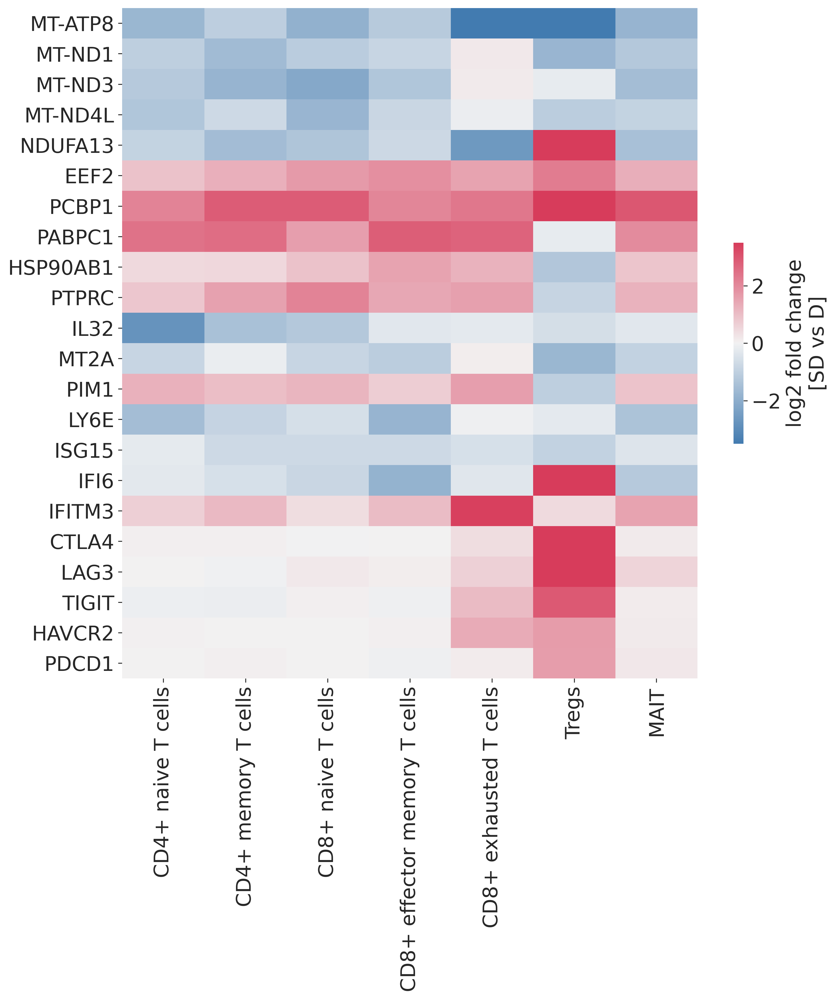

In [95]:
glist = [
    'MT-ATP8','MT-ND1','MT-ND3','MT-ND4L','NDUFA13', # ATP biosynthesis
    'EEF2', 'PCBP1', 'PABPC1', 'HSP90AB1', # translation
    'PTPRC', 'IL32',# T cell activation
    'MT2A','PIM1', # T cell survival
    'LY6E', 'ISG15','IFI6','IFITM3',  # ISGs
    'CTLA4', 'LAG3', 'TIGIT', 'HAVCR2', 'PDCD1', #'FOXP3', 
]
heatmap_cst(cst_pair, glist, ['CD4+ naive T cells', 'CD4+ memory T cells', 'CD8+ naive T cells', 
                             'CD8+ effector memory T cells', 'CD8+ exhausted T cells', 'Tregs', 'MAIT'], 
            save_fd='T_cst_heatmap.pdf')
# heatmap_cst(cst_pair, glist, ['classical monocytes', 'non-classical monocytes', 'intermediate monocytes'], 
#             save_fd='T_cst_heatmap.png')

## Figure 6

{'figure': <Figure size 1800x2190 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

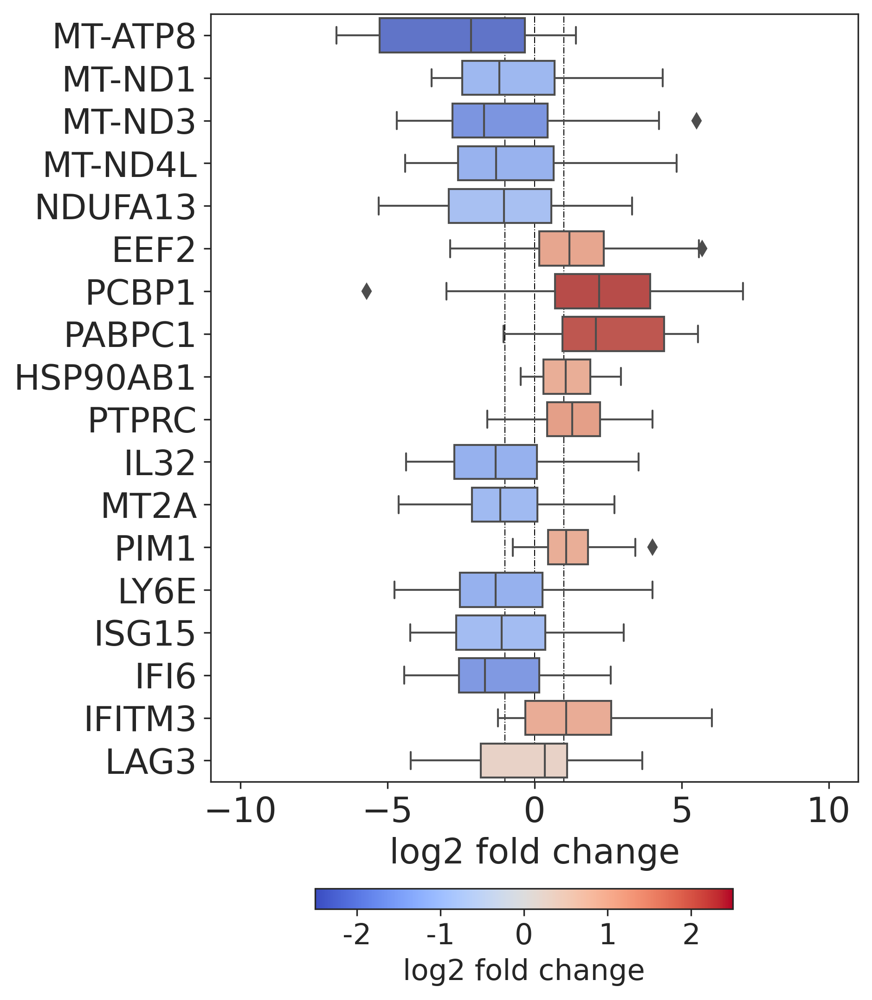

In [96]:
child_genes = [
    'MT-ATP8','MT-ND1','MT-ND3','MT-ND4L','NDUFA13', # ATP biosynthesis
    'EEF2', 'PCBP1', 'PABPC1', 'HSP90AB1', # translation
    'PTPRC', 'IL32',# T cell activation
    'MT2A','PIM1', # T cell survival
    'LY6E', 'ISG15','IFI6','IFITM3',  # ISGs
    'LAG3',
#     'CTLA4', 'LAG3', 'TIGIT', 'HAVCR2', 'PDCD1', #'FOXP3', 
]
pairwise_boxplot(ct_log2FC, ['T cells'], child_genes, path='T_child.pdf')
# pairwise_boxplot(ct_log2FC, ['T cells'], child_genes, path='T_child.png')

{'figure': <Figure size 1800x2190 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

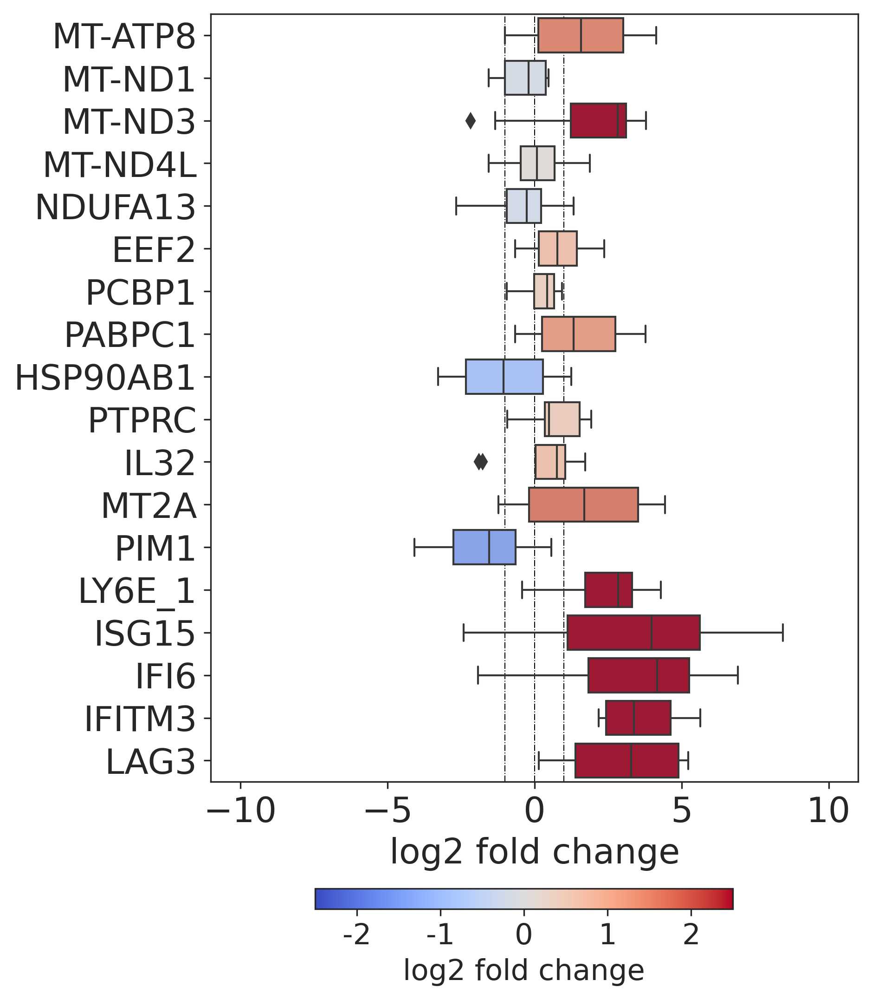

In [97]:
adult_genes = [
    'MT-ATP8','MT-ND1','MT-ND3','MT-ND4L','NDUFA13', # ATP biosynthesis
    'EEF2', 'PCBP1', 'PABPC1', 'HSP90AB1', # translation
    'PTPRC', 'IL32',# T cell activation
    'MT2A','PIM1', # T cell survival
    'LY6E_1', 'ISG15','IFI6','IFITM3',  # ISGs
    'LAG3',
#     'CTLA4', 'LAG3', 'TIGIT', 'HAVCR2', 'PDCD1_1', #'FOXP3', 
]
 
pairwise_boxplot(ct_log2FC_a, ['T cells'], adult_genes, path='T_adult.pdf')
# pairwise_boxplot(ct_log2FC_a, ['Monocytes'], adult_genes, path='mo_adult.png')

In [16]:
df, r = pairwise_processing(ct_pair.loc['T cells'], ct_pair_a.loc['T cells'])
adata_kid_T = adata_kid[adata_kid.obs.cell_type_new == 'T cells']
adata_kid_T = removegenes(adata_kid_T)
sc.pp.filter_genes(adata_kid_T, min_cells=3)
df = df.loc[[x for x in df.index if x in adata_kid_T.var_names]]

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [19]:
mark_list = {}
for m in ['1', '2', '3', '4']:   
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()

for m in ['5', '6', '7', '8']:
    mark_list[m] = df[df['markers'] == m].sort_values('r', ascending=False).index.tolist()[:3]
    
mark_list

{'1': ['MTRNR2L12', 'IFITM3', 'PABPC1', 'CAPN2'],
 '2': ['IFI6', 'ISG15', 'MT-ND3', 'MT-ATP8', 'MT2A'],
 '3': [],
 '4': ['SELL', 'PIM1', 'HSP90AB1'],
 '5': ['PCBP1', 'CDC25B', 'CSDE1'],
 '6': ['ACACB', 'COL6A3', 'CCL5'],
 '7': ['RPL17', 'IL32', 'RPL26'],
 '8': ['CXCR4', 'JUNB', 'FOS']}

{'figure': <Figure size 2100x2100 with 1 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change (SD vs D)\nin children', ylabel='log2 fold change (SD vs D)\nin adults'>}

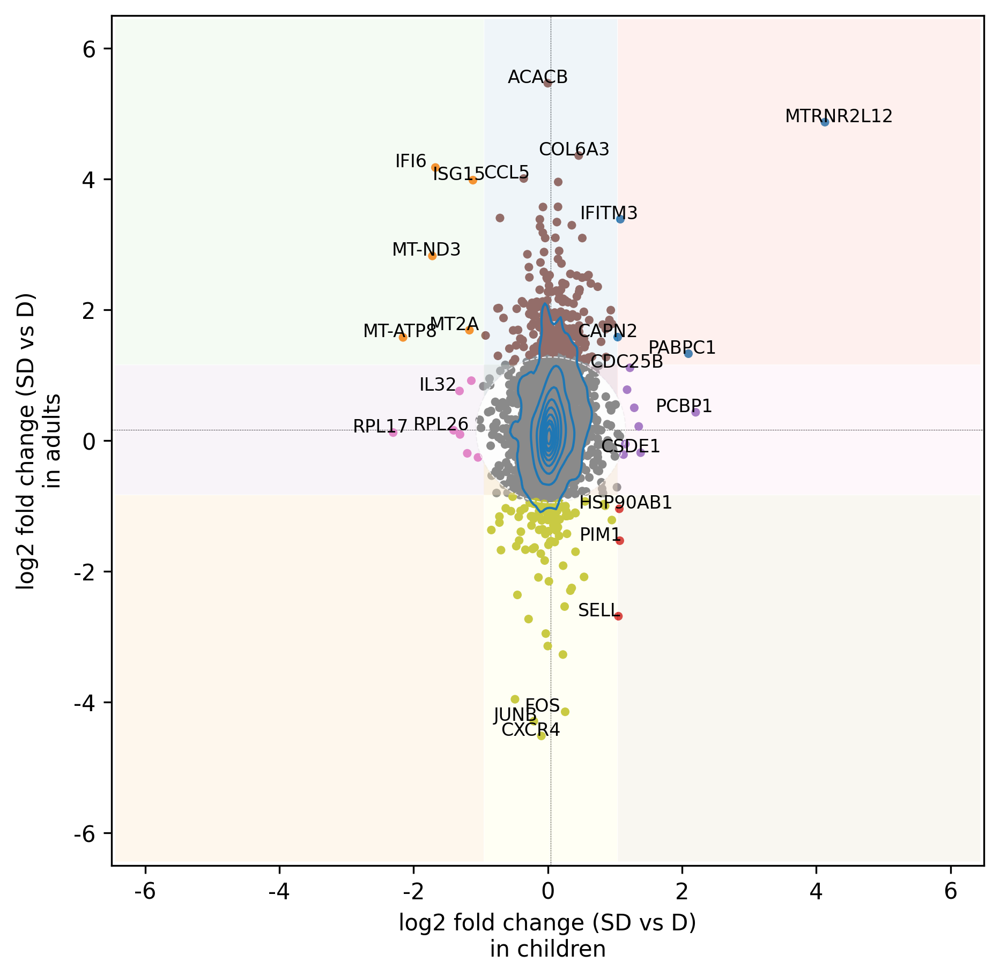

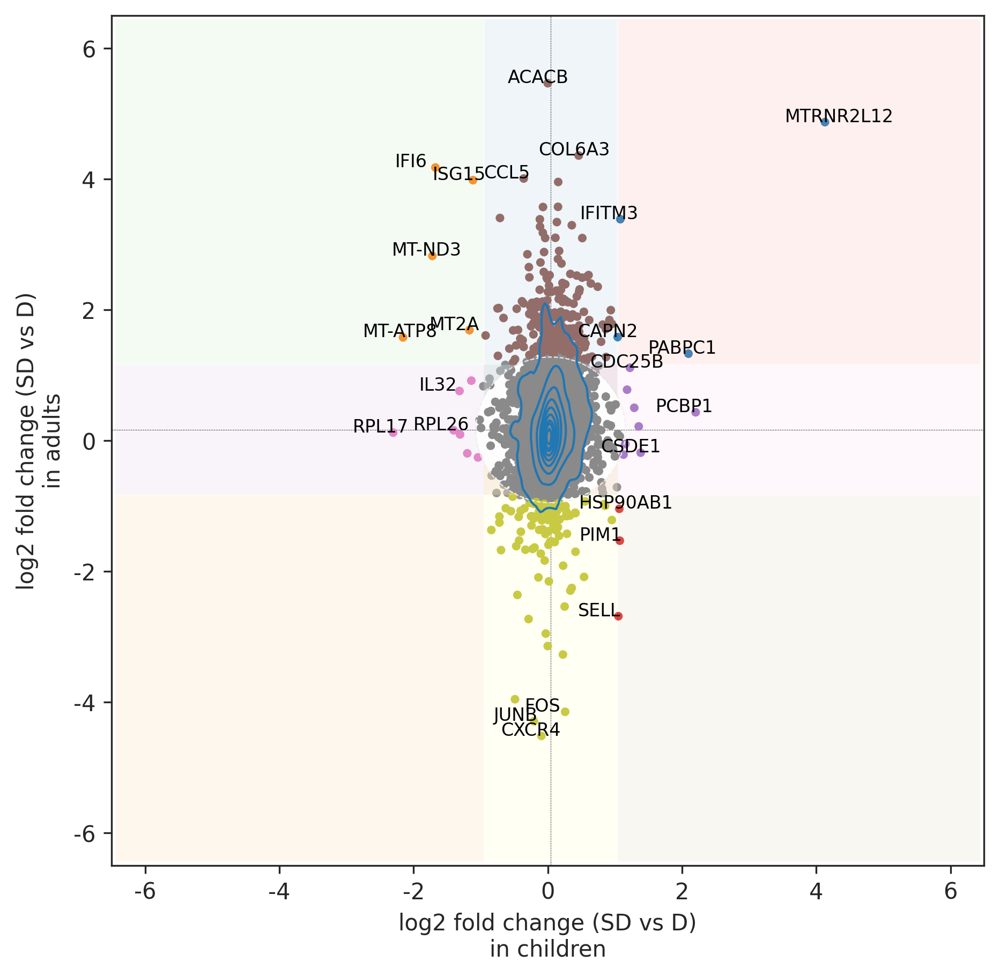

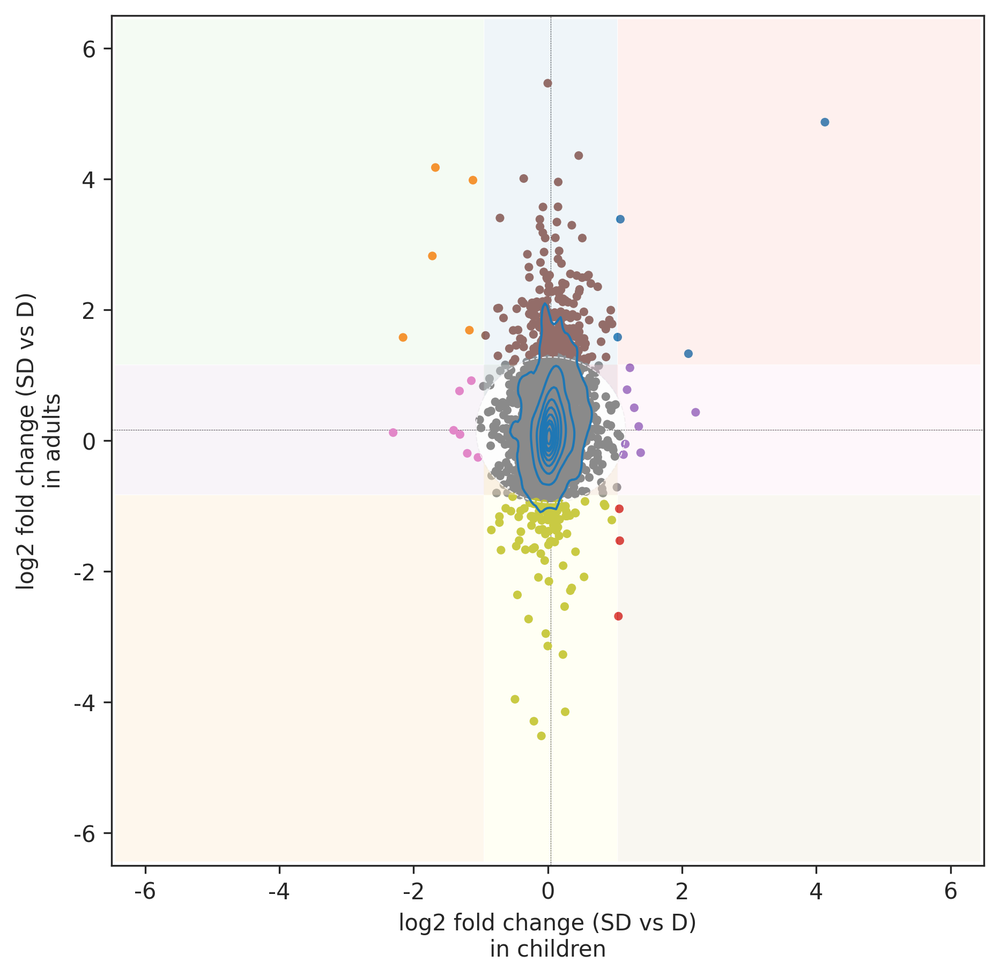

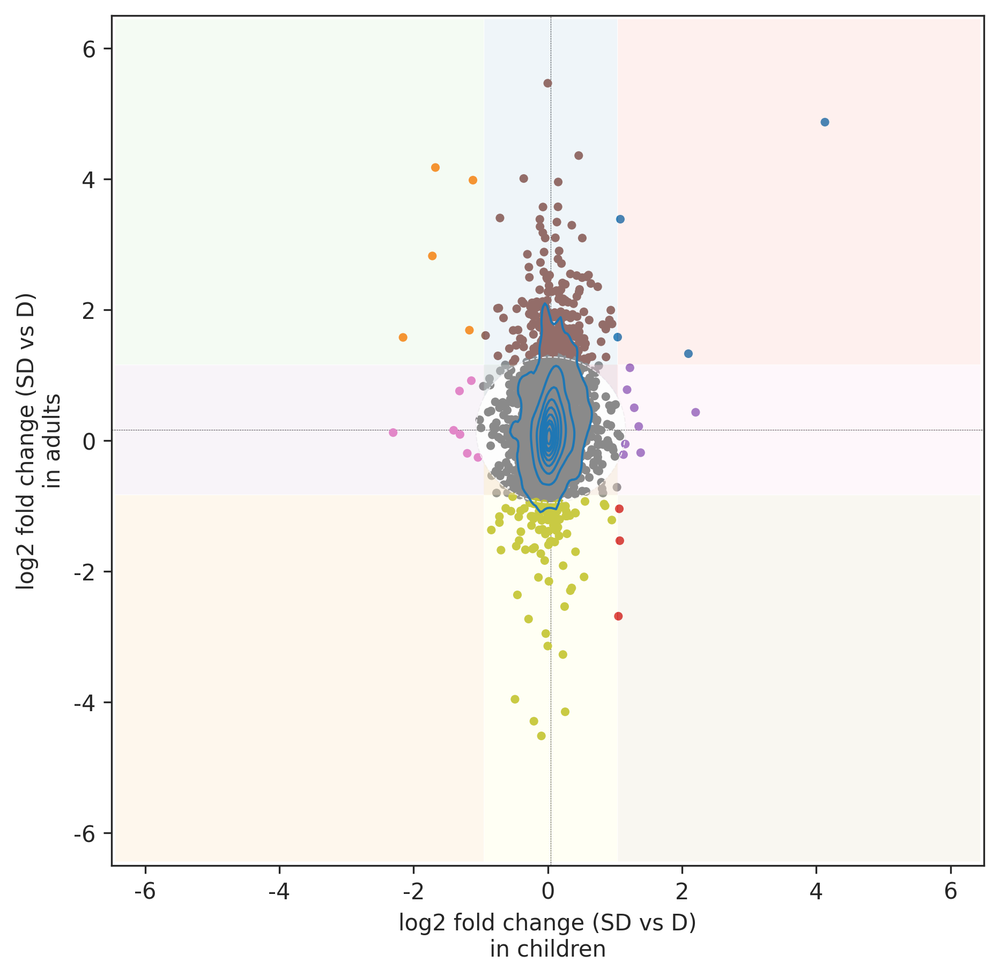

In [17]:
import itertools
marklist = list(itertools.chain.from_iterable(mark_list.values()))

scatter_pairwise(df, r, marklist, name='DEGs_T.png', xlim=6.5)
scatter_pairwise(df, r, marklist, name='DEGs_T.pdf', xlim=6.5)

scatter_pairwise(df, r, [], name='DEGs_T_new.png', xlim=6.5)
scatter_pairwise(df, r, [], name='DEGs_T_new.pdf', xlim=6.5)

# B cells

In [131]:
ct_pair.loc['B cells'][(ct_pair.loc['B cells']['med_pair'] >= 1) | 
                       (ct_pair.loc['B cells']['med_pair'] <= -1)].sort_values('med_pair', ascending=False)

,med_pair,fra_pair,neg_fra_pair,S_fra,NS_fra,S_avg,NS_avg,log2_fold_change,statistic,pvalue,pvalue_corrected
gene,,,,,,,,,,,
MTRNR2L12,4.461266,0.785714,0.214286,0.731770,0.442969,214.754425,23.580940,3.133778,0.289333,5.853556e-276,3.651643e-272
PCBP1,3.321757,0.821429,0.178571,0.499796,0.268357,25.898672,4.707847,2.236516,0.233796,4.059263e-179,1.519382e-175
PABPC1,2.568782,0.928571,0.071429,0.929263,0.735892,962.665588,171.408035,2.482706,0.333504,0.000000e+00,0.000000e+00
PTPRC,1.844678,0.857143,0.142857,0.672209,0.521577,92.929779,30.650745,1.569343,0.164451,2.728062e-88,3.927359e-85
EEF2,1.839309,0.821429,0.178571,0.723865,0.626743,149.006165,67.602814,1.128682,0.156680,3.867398e-80,4.669572e-77
EZR,1.607877,0.875000,0.125000,0.490936,0.357721,23.960003,8.859822,1.339985,0.138266,1.971027e-62,1.715710e-59
NCL,1.543863,0.928571,0.071429,0.682159,0.557828,96.250153,39.013618,1.281209,0.133660,2.357338e-58,1.838233e-55
HLA-DQA2,1.473335,0.571429,0.428571,0.449911,0.375515,19.495245,11.276505,0.739389,0.075910,4.545045e-19,1.141752e-16
IFITM3,1.415845,0.767857,0.232143,0.285812,0.179657,5.023724,2.218043,0.904472,0.106287,5.216968e-37,2.569357e-34


In [150]:
genes1 = cst_pair.loc['naive B cells'][(cst_pair.loc['naive B cells']['med_pair'] >= 1) | 
                       (cst_pair.loc['naive B cells']['med_pair'] <= -1)].sort_values('med_pair', ascending=False).index

In [151]:
genes2 = cst_pair.loc['memory B cells'][(cst_pair.loc['memory B cells']['med_pair'] >= 1) | 
                       (cst_pair.loc['memory B cells']['med_pair'] <= -1)].sort_values('med_pair', ascending=False).index

In [152]:
genes3 = cst_pair.loc['activated B cells'][(cst_pair.loc['activated B cells']['med_pair'] >= 1) | 
                       (cst_pair.loc['activated B cells']['med_pair'] <= -1)].sort_values('med_pair', ascending=False).index

{'figure': <Figure size 1650x1500 with 2 Axes>, 'ax': <AxesSubplot:>}

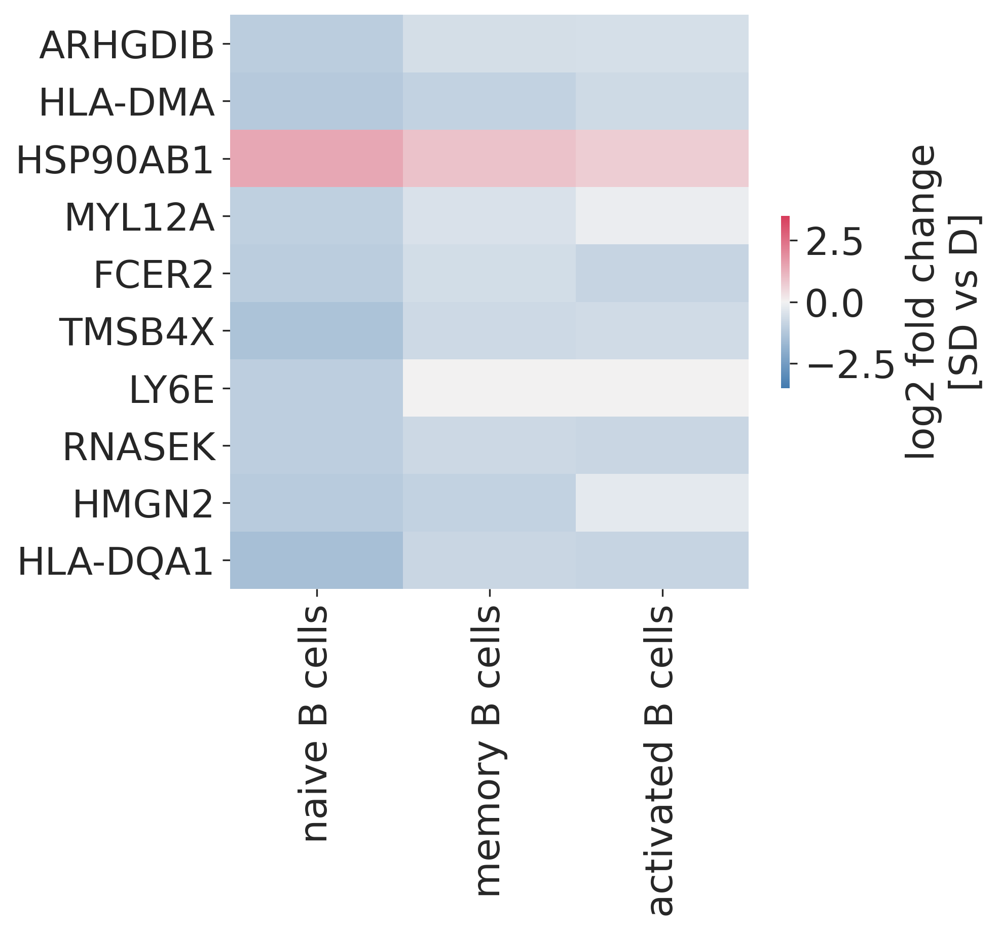

In [160]:
ls1 = list(set(genes1) - set(genes2.tolist() + genes3.tolist()))

heatmap_cst(cst_pair, ls1, ['naive B cells', 'memory B cells', 'activated B cells'], 
            save_fd=False)

# LY6E, HLA-DMA, HLA-DQA1

<ipython-input-12-ca8892b7dead>:9: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df = cst_pair.reset_index().set_index('gene').loc[g_list][['cell_subtype', 'med_pair']]


{'figure': <Figure size 1650x6150 with 2 Axes>, 'ax': <AxesSubplot:>}

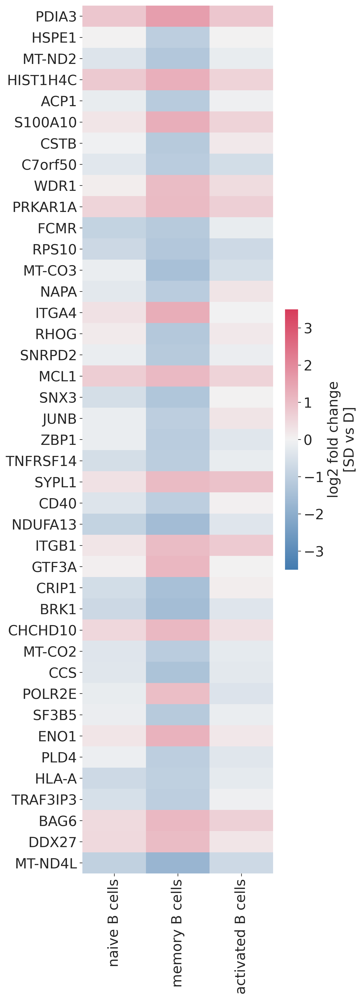

In [161]:
ls2 = (set(genes2) - set(genes1.tolist() + genes3.tolist()))
heatmap_cst(cst_pair, ls2, ['naive B cells', 'memory B cells', 'activated B cells'], 
            save_fd=False)

# ATP metabolic process: ENO1,MT-CO2,MT-CO3,MT-ND2,MT-ND4L,NDUFA13,CHCHD10,ACP1,CCS,POLR2E

<ipython-input-12-ca8892b7dead>:9: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df = cst_pair.reset_index().set_index('gene').loc[g_list][['cell_subtype', 'med_pair']]


{'figure': <Figure size 1650x5100 with 2 Axes>, 'ax': <AxesSubplot:>}

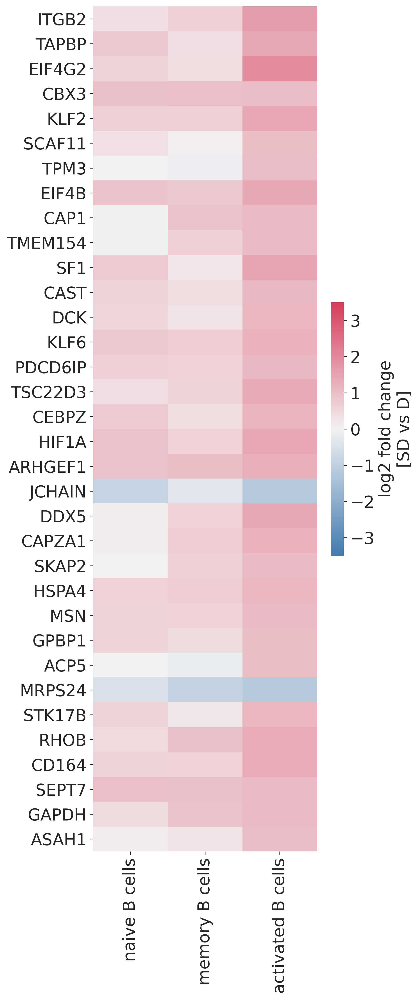

In [163]:
ls3 = (set(genes3) - set(genes1.tolist() + genes2.tolist()))
heatmap_cst(cst_pair, ls3, ['naive B cells', 'memory B cells', 'activated B cells'], 
            save_fd=False)
# leukocyte activation: KLF6,ITGB2,MSN,SKAP2

{'figure': <Figure size 1800x1770 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

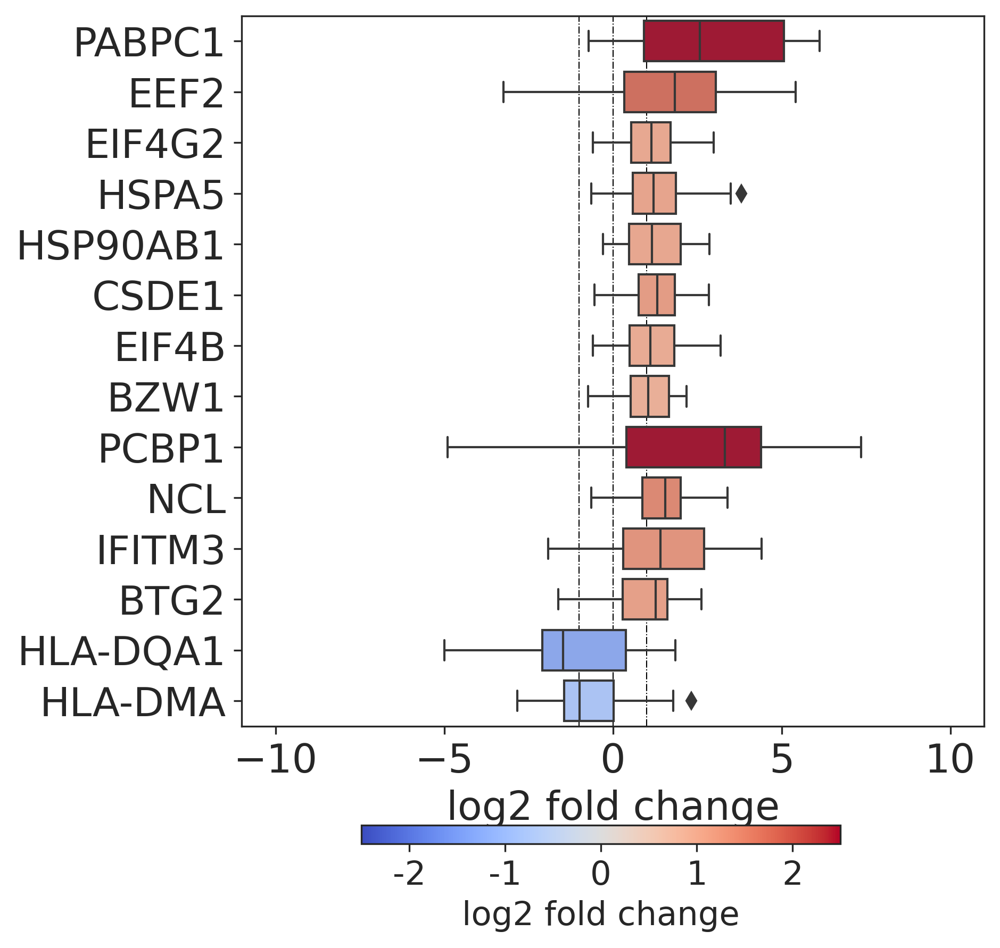

In [170]:
B_genes = [
    'PABPC1', 'EEF2','EIF4G2','HSPA5', 'HSP90AB1', 'CSDE1',
    'EIF4B','BZW1', 'PCBP1', 'NCL',
    'IFITM3',
    'BTG2',
    'HLA-DQA1', 'HLA-DMA'
]
pairwise_boxplot(ct_log2FC, ['B cells'], B_genes, path='box_B_genes.pdf')
# pairwise_boxplot(ct_log2FC, ['T cells'], mo_genes, path='box_T_genes.png')

{'figure': <Figure size 1650x2700 with 2 Axes>, 'ax': <AxesSubplot:>}

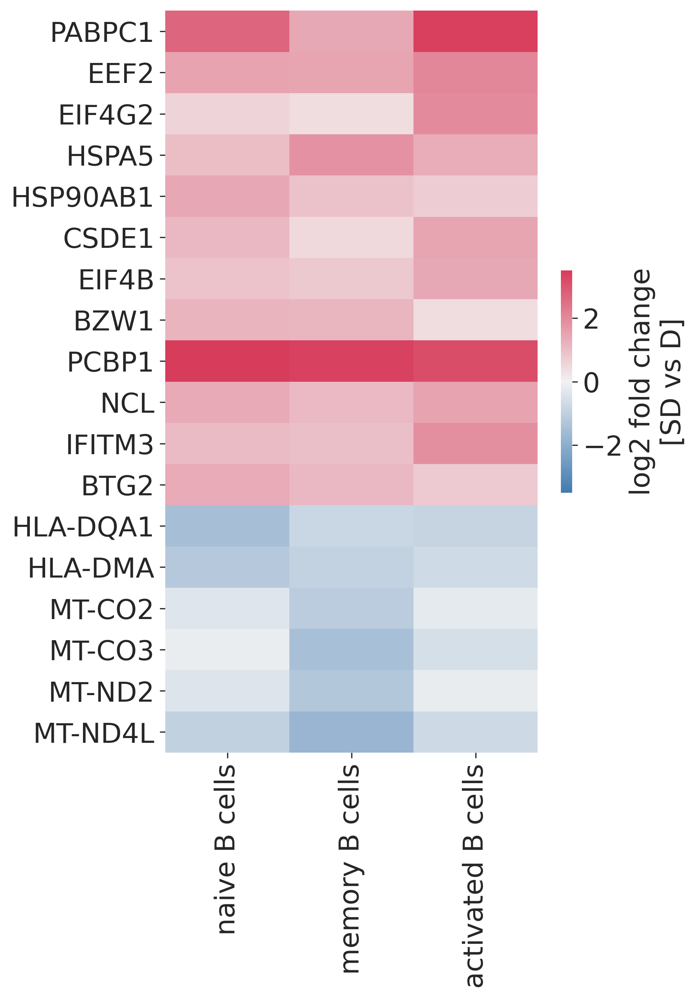

In [171]:
glist = [
    'PABPC1', 'EEF2','EIF4G2','HSPA5', 'HSP90AB1','CSDE1',
    'EIF4B','BZW1', 'PCBP1', 'NCL',
    'IFITM3',
    'BTG2',
    'HLA-DQA1', 'HLA-DMA',
    'MT-CO2','MT-CO3','MT-ND2','MT-ND4L'
]
heatmap_cst(cst_pair, glist, ['naive B cells', 'memory B cells', 'activated B cells'], 
            save_fd='B_cst_heatmap.pdf')
# heatmap_cst(cst_pair, glist, ['classical monocytes', 'non-classical monocytes', 'intermediate monocytes'], 
#             save_fd='T_cst_heatmap.png')

{'figure': <Figure size 1800x2190 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

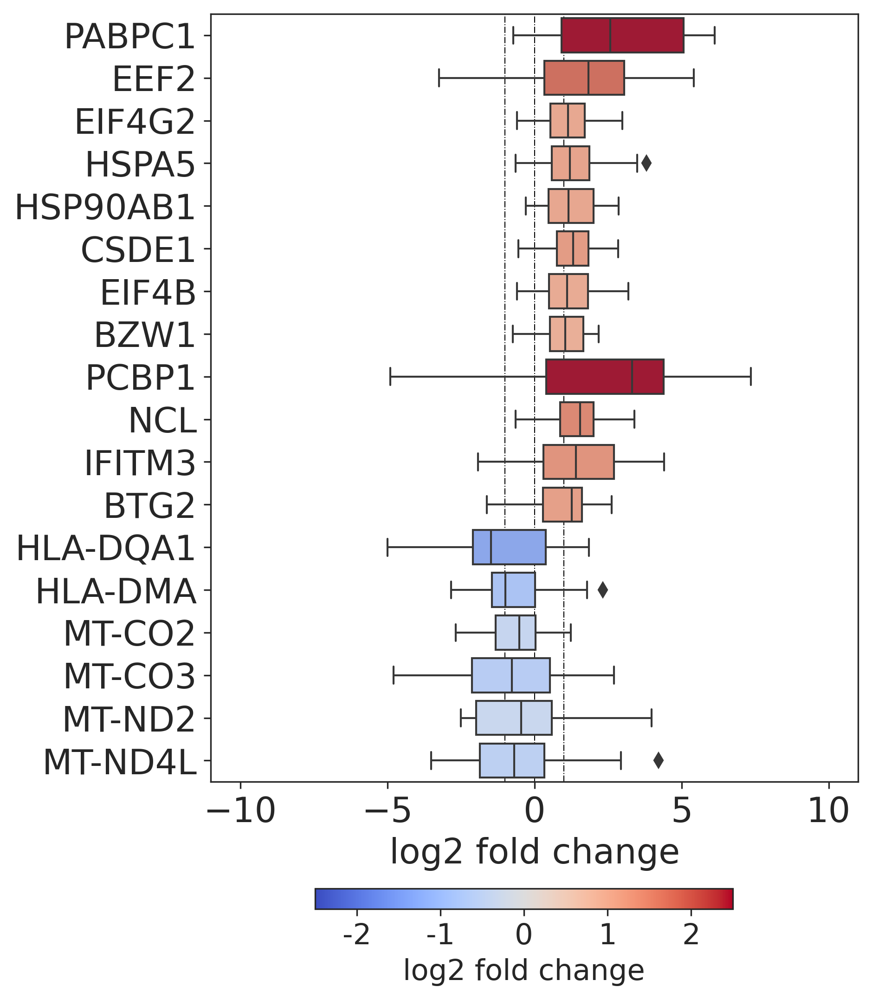

In [172]:
child_genes = [
    'PABPC1', 'EEF2','EIF4G2','HSPA5', 'HSP90AB1','CSDE1',
    'EIF4B','BZW1', 'PCBP1', 'NCL',
    'IFITM3',
    'BTG2',
    'HLA-DQA1', 'HLA-DMA',
    'MT-CO2','MT-CO3','MT-ND2','MT-ND4L'
]
pairwise_boxplot(ct_log2FC, ['B cells'], child_genes, path='B_child.pdf')
# pairwise_boxplot(ct_log2FC, ['T cells'], child_genes, path='T_child.png')

{'figure': <Figure size 1800x2190 with 2 Axes>,
 'ax': <AxesSubplot:xlabel='log2 fold change'>}

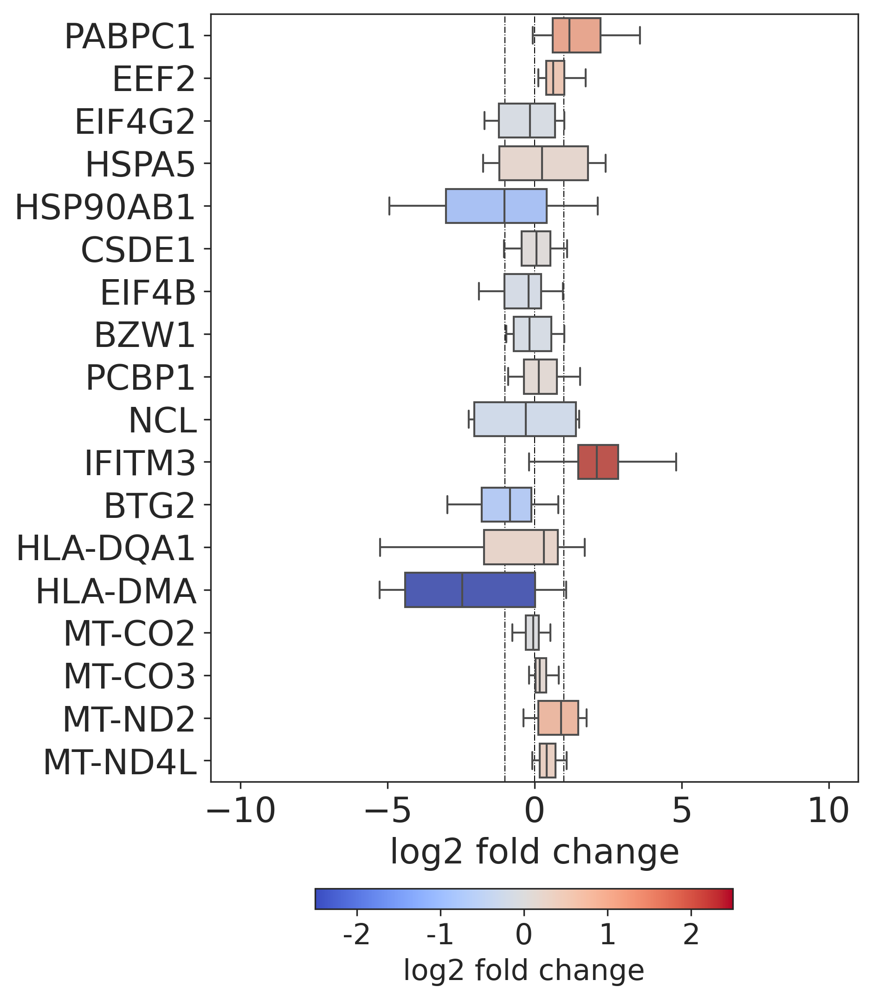

In [173]:
adult_genes = [
    'PABPC1', 'EEF2','EIF4G2','HSPA5', 'HSP90AB1','CSDE1',
    'EIF4B','BZW1', 'PCBP1', 'NCL',
    'IFITM3',
    'BTG2',
    'HLA-DQA1', 'HLA-DMA',
    'MT-CO2','MT-CO3','MT-ND2','MT-ND4L'
]
 
pairwise_boxplot(ct_log2FC_a, ['B cells'], adult_genes, path='B_adult.pdf')
# pairwise_boxplot(ct_log2FC_a, ['Monocytes'], adult_genes, path='mo_adult.png')